In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

import sys
import glob
import os
import peakutils
import datetime
import warnings
import logging
from jupyterthemes import jtplot

In [2]:
from xps.xps_sw import *
from xps.xps_import import *
from xps.xps_analysis import *
from xps.xps_bg import *

jtplot.style('default', grid=False)
logging.getLogger().setLevel(logging.CRITICAL)

plt.rcParams['errorbar.capsize'] = 8
plt.rcParams['font.size'] = 18
plt.rc('font', size= 18)
plt.rc('legend', fontsize= 15)
plt.rc('xtick', labelsize= 18)
plt.rc('xtick.major', size=6)
plt.rc('ytick.major', size=6)

plt.rc('ytick', labelsize= 18)
plt.rc('axes', labelsize=18)
plt.rc('axes', titlesize=18)

In [3]:
asf = dict({'C1s' : 0.296, 'O1s' : 0.711, 'N1s' : 0.477, 'Br3p' : 1.054, 'Br3d' : 1.054,
           'In3d' : 4.359, 'Sn3d' : 4.725, 'Cl2p' : 0.891, 'Si2p': 0.339})

In [54]:
def plot_xp_regions(experiments : list, regions : list, ncols: int = 3):
    """Subplots all regions of a list of experiments (unnormalised)"""
    rows = int(np.ceil(len(regions) / ncols))

    fig, ax = plt.subplots(rows, ncols, figsize=(16, 8))
    for i,r in enumerate(regions):
            for c,xp in enumerate(experiments):
                j, k = i//ncols, i%ncols
                if i == len(regions) - 1:   # Set labels from last region
                    lb = xp.name
                else:
                    lb='__nolabel__'
                
                try:
                    li = plot_region(xp, r, ax=ax[j][k], lb=lb)
                except KeyError:
                    pass
                
                ax[j][k].set_title(r)
                leg = ax[j][k].get_legend()
                if leg is not None: leg.remove()
                cosmetics_plot(ax=ax[j][k], leg = False);
                
            if len(experiments)%2 == 0:
                ax[j][k].invert_xaxis()
    fig.legend(loc='upper right', bbox_to_anchor=(1.12, 0.5), fontsize=16)
    plt.tight_layout()

### Background subtraction class (dev) 

In [5]:
class Background2(object):
    @staticmethod
    def bg_handler(xp, region,  *args, **kwargs):
        x = xp.dfx[region].dropna().energy.values
        y = xp.dfx[region].dropna().counts.values
        return x, y

    @staticmethod
    def edit_xp(xp, region, x, y, ybg, ax = None):
        if ax == None: ax = plt.gca()
        col = plot_region(xp, region, lb=region, ax=ax).get_color()
        ax.plot(x, ybg, '--', color=col, label='__nolabel__')
        cosmetics_plot(ax=ax)
        
        dfnew = pd.DataFrame({'energy' : x, 'counts' : y - ybg})
        xpNew = deepcopy(xp)
        xpNew.dfx[region] = dfnew
        return xpNew

    def dec_linear(self, xp, region, *args, **kwargs):
        x, y = self.bg_handler(xp, region, *args, **kwargs)

        ybg = peakutils.baseline(y, deg=1)
        return self.edit_xp(xp, region, x, y, ybg)
    
    def dec_shirley(self, xp, region, maxit=40, **kwargs):
        kwargs['maxit'] = maxit
        x,y = self.bg_handler(xp, region, **kwargs)
        ybg = shirley_loop(x,y, **kwargs)
        return self.edit_xp(xp, region, x, y, ybg)
    
    def dec_2shirley(self, xp, region, xlim, maxit=40, **kwargs):
        x, y = self.bg_handler(xp, region, **kwargs)
        y1 = y[ x >= xlim ]
        x1 = x[ x >= xlim ]
        y2 = y[ x <= xlim ]
        x2 = x[ x <= xlim ]

        ybg1 = shirley_loop(x1, y1, maxit = maxit)#, flag_plot=flag_plot, ax = ax)
        ybg2 = shirley_loop(x2, y2, maxit = maxit)#, flag_plot=flag_plot, ax = ax)
        ybg = np.append(np.append(ybg1[:-1], np.average([ybg1[-1], ybg2[0]])), ybg2[1:] )
        return self.edit_xp(xp, region, x, y, ybg, **kwargs)

NameError: name 'trim_exps' is not defined

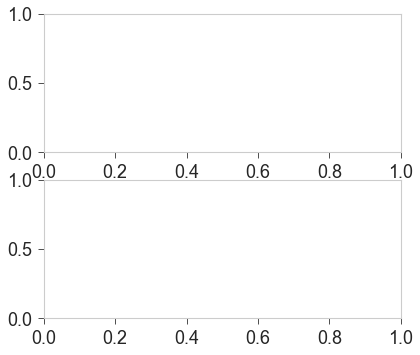

In [6]:
# Background2().dec_linear(xp=experiments[0], region='C_1s')
fig, ax = plt.subplots(2)
BG2 = Background2()
bg2 = BG2.dec_2shirley(xp=trim_exps[0], region='overview_', 
                       xlim = 346, maxit=50, ax=ax[0])
bg2 = BG2.dec_linear(xp=trim_exps[0], 
                     region='overview_', ax=ax[1])

In [ ]:
def test_bg_subpots()
    fig, ax = plt.subplots(2)
    BG2 = Background2()
    bg2 = BG2.dec_2shirley(xp=trim_exps[0], region='overview_', 
                           xlim = 346, maxit=50, ax=ax[0])
    bglin = BG2.dec_linear(xp=trim_exps[0], 
                         region='overview_', ax=ax[1])

    assert len(ax[0].get_lines()) <= 2, "Too many lines in lin_bg subplot"
    assert len(ax[0].get_lines()) >= 2, "Not enough lines in lin_bg subplot"

In [ ]:
BG2 = Background2()
bg2 = BG2.dec_2shirley(xp=trim_exps[0], region='overview_', 
                       xlim = 346, maxit=50, ax=ax[0])
x,y = BG2.bg_handler(xp=trim_exps[0], region='overview_')
x,ybg = BG2.bg_handler(bg2, region='overview_')
lentest = len(np.where(y < ybg)[0])
assert lentest == 0, "Background over signal in %i points"%lentest


In [ ]:
BG2 = Background2()
bg2 = BG2.dec_linear(xp=trim_exps[0], region='overview_')
x,y = BG2.bg_handler(xp=trim_exps[0], region='overview_')
x,ybg = BG2.bg_handler(bg2, region='overview_')
lentest = len(np.where(y < ybg)[0])
assert lentest == 0, "Background over signal in %i points"%lentest


In [ ]:
def test_method(method):
    BG2 = Background2()
    bg2 = method(xp=trim_exps[0], region='overview_')
    x,y = BG2.bg_handler(xp=trim_exps[0], region='overview_')
    x,ybg = BG2.bg_handler(bg2, region='overview_')
    lentest = len(np.where(y < ybg)[0])
    assert lentest == 0, "Background over signal in %i points"%lentest
test_method(Background2().dec_linear)

## Pre-processing of data DEA on ITO O3, plasma
1- Preparation by Zoraida in Valencia (Oct 2020)

# DDEA
Direct Double Elimination Addition anchoring to ITO

## Import data

In [7]:
path = '/Users/pabloherrero/sabat/xps_spectra/ITO_DEA/Zoraida_Hank/DDEA/*.xy'
files = glob.glob(path, recursive=True)
files.sort()
files_new = ['/Users/pabloherrero/sabat/xps_spectra/ITO_DEA/Zoraida_Hank/20201106_ITO_as_received.xy',
             '/Users/pabloherrero/sabat/xps_spectra/ITO_DEA/sublim/ITO_DEA_acid/20200131_ITO_DEA_acid_10min_sublim.xy',
            '/Users/pabloherrero/sabat/xps_spectra/ITO_DEA/cookie_dip/20200211_ITO_DEA_acid_naoh_buoh/20200211_ITO_DEA_acid_naoh_buoh.xy']

for f in files:
    files_new.append(f)

files = files_new
for f in files:
    print(os.path.split(f)[1])

20201106_ITO_as_received.xy
20200131_ITO_DEA_acid_10min_sublim.xy
20200211_ITO_DEA_acid_naoh_buoh.xy
20201028_ITO_DEA_ZTF593_Aire_3.xy
20201029_ITO_DEA_ZTF593_ON2.xy
20201103_ITO_DEA_ZTF593_PN2.xy
20201105_ITO_DEA_ZTF593_PA1.xy
20201105_ITO_DEA_ZTF593_PN1.xy
20201106_ITO_DEA_ZTF593_OA2.xy


In [14]:
experiments = [xps_data_import(path=f) for f in files]
experiments[1].name

'ITO_DEA_acid_10min_sublim'

In [15]:
for xp in experiments[1:]:
    xp.name = xp.name.strip('ITO_DEA_')

### Change Br3p3/2 to Br3p

In [16]:
for xp in experiments:
    try:
        xp.dfx.rename_axis({'In3d5/2': 'In3d'}, axis=1, copy=False, inplace=True)
        xp.dfx.rename_axis({'Sn3d5/2': 'Sn3d'}, axis=1, copy=False, inplace=True)
        xp.dfx.rename_axis({'Br3p3/2': 'Br3p'}, axis=1, copy=False, inplace=True)
#         xp.dfx.rename_axis({'Br3p_(2)': 'Br3p'}, axis=1, copy=False, inplace=True)
    except KeyError:
        pass
experiments[3].dfx.rename_axis({'Br3p(2)': 'Br3p'}, axis=1, copy=False, inplace=True)

/Users/pabloherrero/anaconda3/envs/IC-3.7-2018-11-14/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Using 'rename_axis' to alter labels is deprecated. Use '.rename' instead
  This is separate from the ipykernel package so we can avoid doing imports until
/Users/pabloherrero/anaconda3/envs/IC-3.7-2018-11-14/lib/python3.7/site-packages/ipykernel_launcher.py:4: FutureWarning: Using 'rename_axis' to alter labels is deprecated. Use '.rename' instead
  after removing the cwd from sys.path.
/Users/pabloherrero/anaconda3/envs/IC-3.7-2018-11-14/lib/python3.7/site-packages/ipykernel_launcher.py:5: FutureWarning: Using 'rename_axis' to alter labels is deprecated. Use '.rename' instead
  """
/Users/pabloherrero/anaconda3/envs/IC-3.7-2018-11-14/lib/python3.7/site-packages/ipykernel_launcher.py:9: FutureWarning: Using 'rename_axis' to alter labels is deprecated. Use '.rename' instead
  if __name__ == '__main__':


## Crop and align In 3d to reference ITO BE
According to Moulder Handbook, In$_2$O$_3$ has In 3d5/2 on 444.5 eV

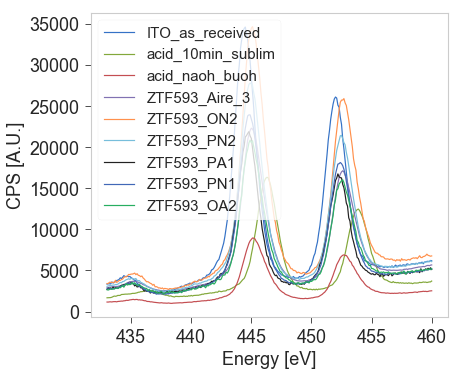

In [17]:
region = 'In3d'
for xp in experiments:
    plot_region(xp, region)
cosmetics_plot()

/Users/pabloherrero/sabat/sabatsw/xps/xps_analysis.py:61: RuntimeWarning: invalid value encountered in greater
  dropup = np.where(xp.dfx[region].energy.values > eup)[0]


Text(0.5, 1.0, 'In 3d')

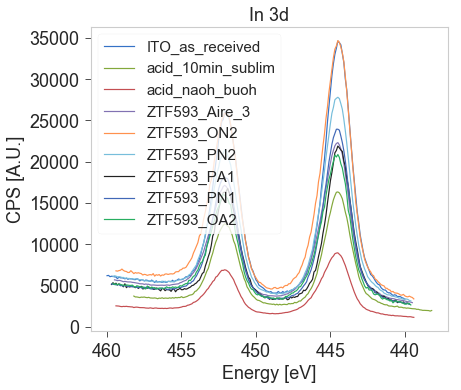

In [18]:
region = 'In3d'
aligned_exps = []

for xp in experiments:
    xp_new = crop_spectrum(xp, region=region, eup=None, edw=440)
    
    shift = find_shift(xp_new, xpRef=experiments[0], region=region)
    align_dfx(xp_new, shift, inplace = True)
    aligned_exps.append(xp_new)
    plot_region(xp_new, region)
plt.title('In 3d')

## BG subtraction

### Subtract double shirley to all In 3d regions

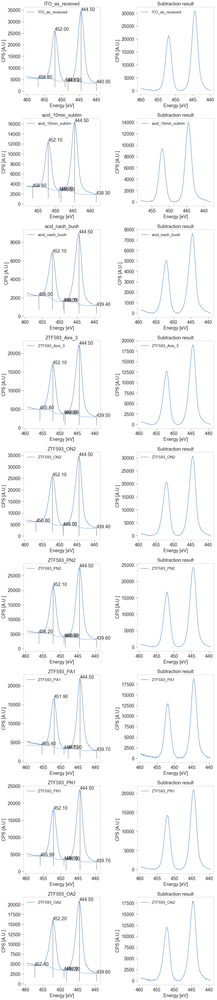

In [19]:
region = 'In3d'

bg_exps = region_2bg_subtract(aligned_exps, region=region, xlim=449)

### Bulk subtract background

In [20]:
experiments[1].dfx.columns.levels[0]

Index(['Br3p', 'C1s', 'In3d', 'N1s', 'O1s', 'Sn3d', 'overview'], dtype='object', name='range')

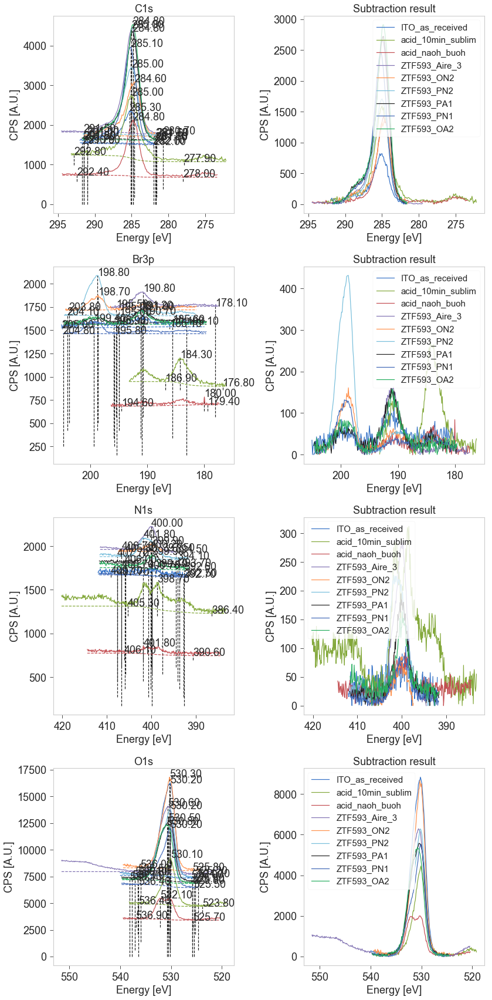

In [21]:
regions = ['C1s', 'Br3p', 'N1s', 'O1s']
bg_exps = bulk_bg_subtract(bg_exps, regions)

### Sn 3d: refine double shirley

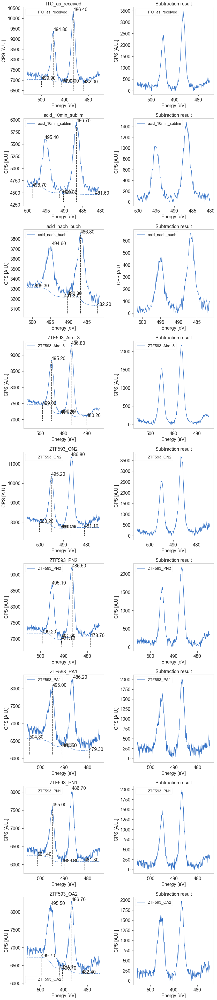

In [22]:
bg_exps = region_2bg_subtract(bg_exps, region='Sn3d', xlim=491, )

### Br 3p: refine double shirley

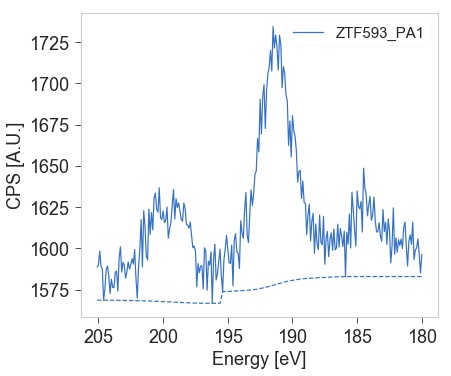

In [23]:
region = 'Br3p'
xpbg = subtract_double_shirley(experiments[6], region, xlim=195.5)
bg_exps[6].dfx[region] = xpbg.dfx[region]

### Br 3d

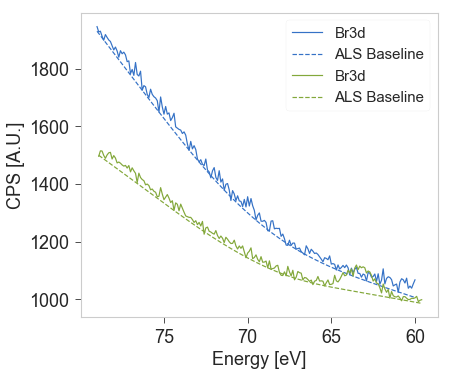

In [24]:
region = 'Br3d'

xp_crop = crop_spectrum(bg_exps[0], region, eup=79)
bg_exps[0] = subtract_als_bg(xp_crop, region)

xp_crop = crop_spectrum(bg_exps[8], region, eup=79)
bg_exps[8] = subtract_als_bg(xp_crop, region)

cosmetics_plot()

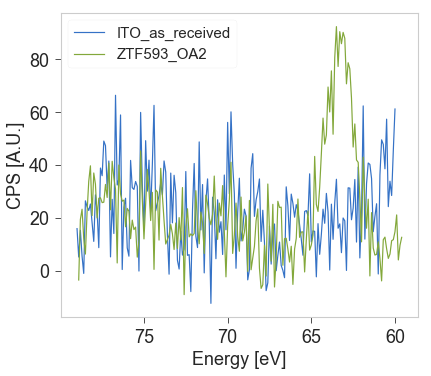

In [112]:
region = 'Br3d'

plot_region(bg_exps[0], region)
plot_region(bg_exps[8], region)

cosmetics_plot()

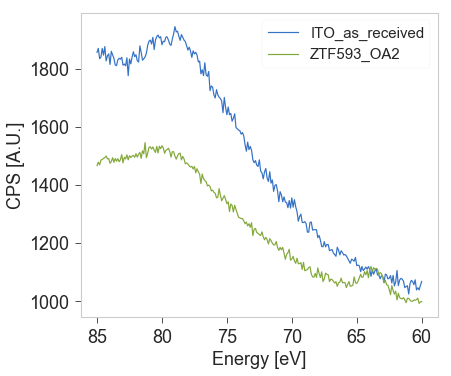

In [25]:
region = 'Br3d'

plot_region(experiments[0], region)
plot_region(experiments[8], region)

cosmetics_plot()

Text(1071.8, 22000.0, 'Na 1s')

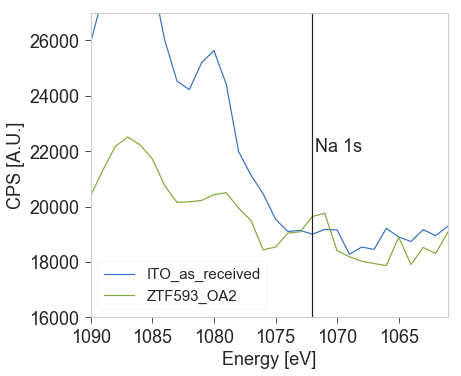

In [39]:
region = 'overview'

plot_region(experiments[0], region)
plot_region(experiments[8], region)

plt.xlim(1090, 1061)
plt.ylim(1.6e4, 2.7e4)
plt.axvline(x=1072, color='k')
plt.text(s='Na 1s', x=1071.8, y=2.2e4)
# cosmetics_plot()

### Si 2p

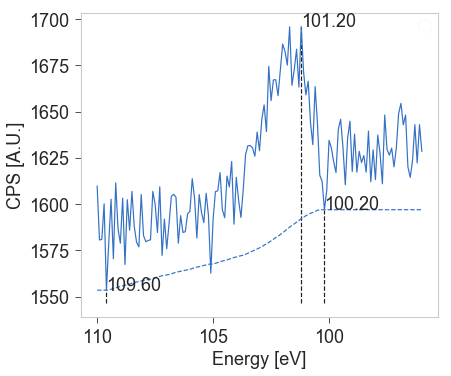

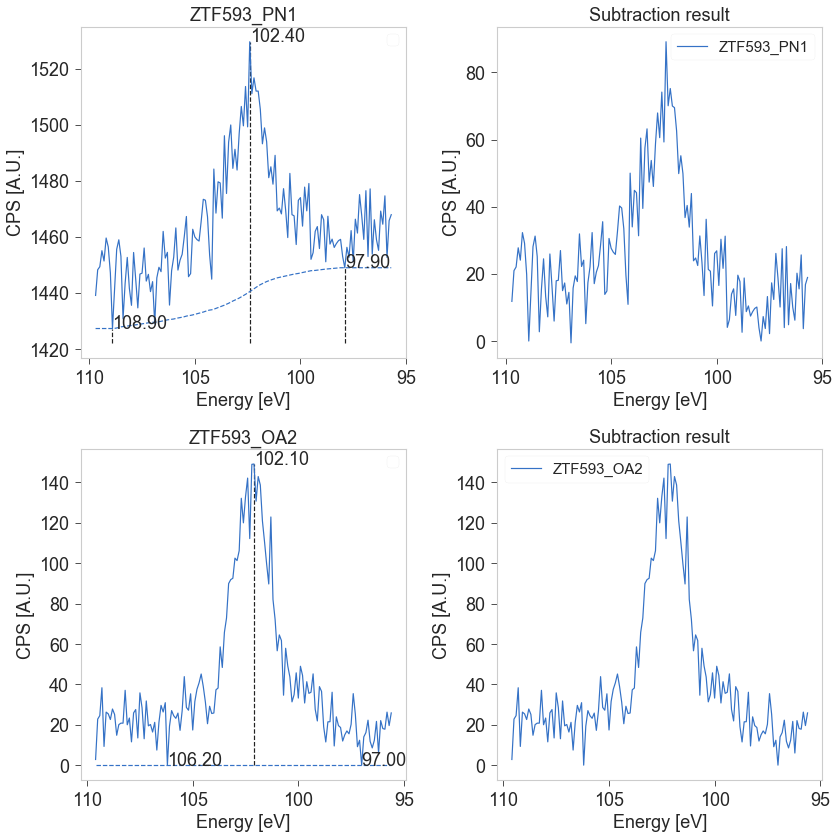

In [21]:
region = 'Si2p'
bg_exps[0] = subtract_shirley_bg(bg_exps[0], region, maxit=40)
bg_exps[7:] = region_bg_subtract(bg_exps[7:], region=region)

### Plot result of bulk subtract

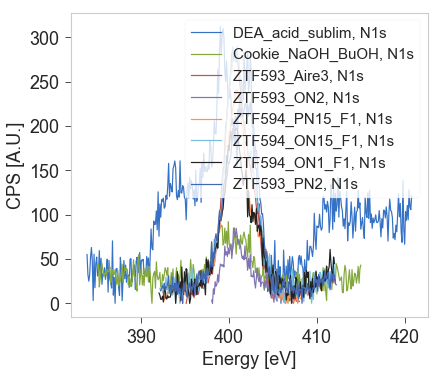

In [320]:
region = 'N1s'
for xp in bg_exps:
    plot_region(xp, region)

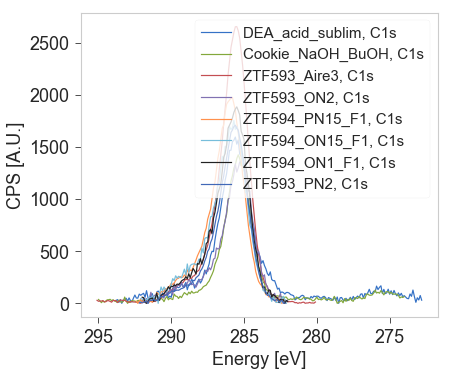

In [321]:
region = 'C1s'
for xp in bg_exps:
    plot_region(xp, region)
cosmetics_plot()

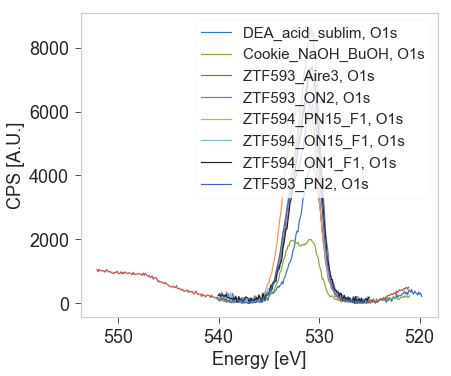

In [322]:
region = 'O1s'
for xp in bg_exps:
    plot_region(xp, region)
cosmetics_plot()

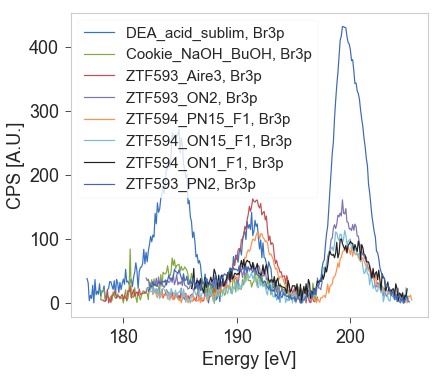

In [323]:
region = 'Br3p'
for xp in bg_exps:
    plot_region(xp, region)
# cosmetics_plot()

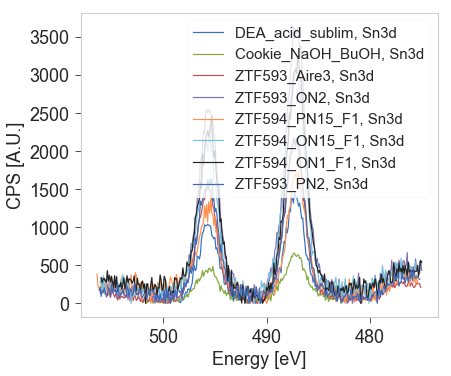

In [324]:
region = 'Sn3d'
for xp in bg_exps:
    plot_region(xp, region)
cosmetics_plot()

### Trim O, N, C 1s regions

/Users/pabloherrero/sabat/sabatsw/xps/xps_analysis.py:61: RuntimeWarning: invalid value encountered in greater
  dropup = np.where(xp.dfx[region].energy.values > eup)[0]


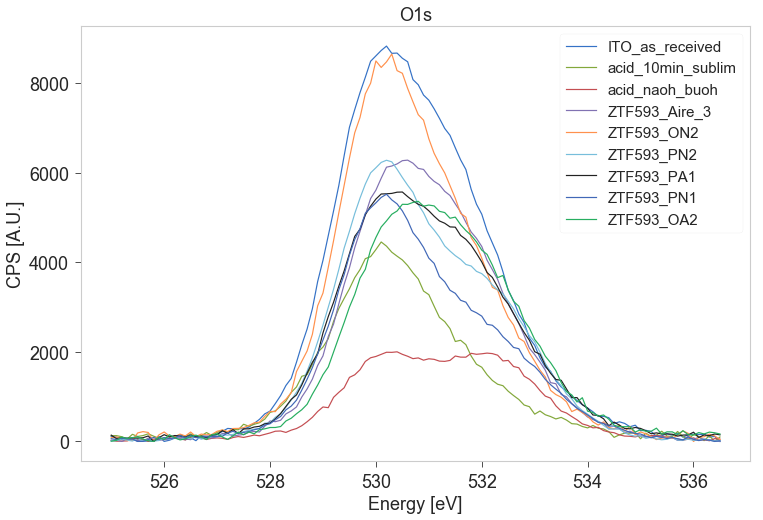

In [22]:
region = 'O1s'
fig, ax = plt.subplots(1, figsize=(12, 8))
new_exps = []
for xp in bg_exps:
    xp_crop = crop_spectrum(xp, region, eup=536.5, edw=525)
    plot_region(xp_crop, region)
    new_exps.append(xp_crop)
cosmetics_plot()
ax.set(title=region)
bg_exps = new_exps

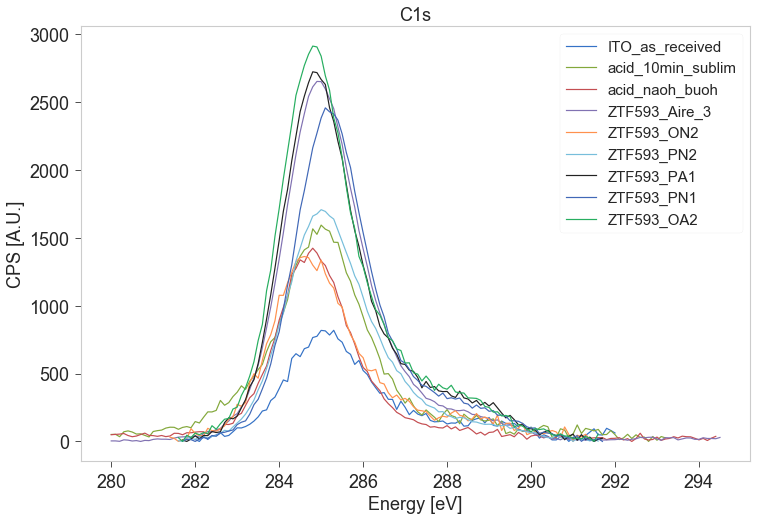

In [23]:
region = 'C1s'
fig, ax = plt.subplots(1, figsize=(12, 8))
new_exps = []
for xp in bg_exps:
    xp_crop = crop_spectrum(xp, region,  eup=None, edw=280)
    plot_region(xp_crop, region)
    new_exps.append(xp_crop)
cosmetics_plot()
ax.set(title=region)
bg_exps = new_exps

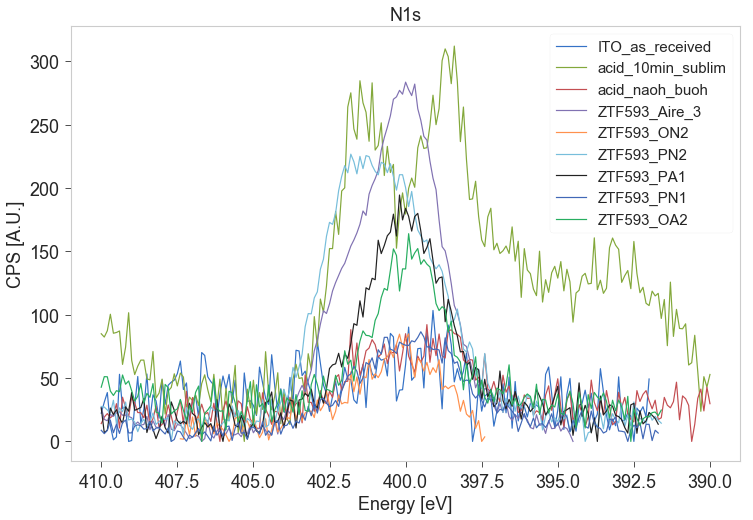

In [24]:
region = 'N1s'
fig, ax = plt.subplots(1, figsize=(12, 8))
new_exps = []
for xp in bg_exps:
    xp_crop = crop_spectrum(xp, region, eup=410, edw=390)
    plot_region(xp_crop, region)
    new_exps.append(xp_crop)
# cosmetics_plot()
ax.set(title=region)
bg_exps = new_exps

## Inspect overview

[Text(0.5, 1.0, 'Ta 5d region')]

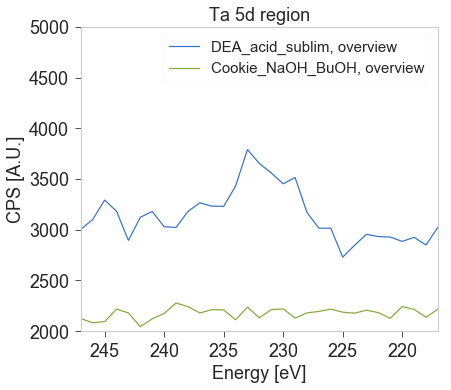

In [284]:
plot_region(experiments[0], region='overview')
plot_region(experiments[1], region='overview')

plt.gca().set_xlim(247, 217)
plt.gca().set_ylim(2000, 5e3)
plt.gca().set(title='Ta 5d region')

[Text(0.5, 1.0, 'Br 3p region')]

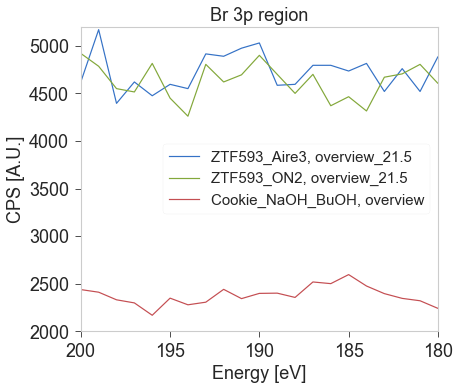

In [285]:
plot_region(experiments[2], region='overview_21.5')
plot_region(experiments[3], region='overview_21.5')

plot_region(experiments[1], region='overview')

plt.gca().set_xlim(200, 180)
plt.gca().set_ylim(2000, 5.2e3)
plt.gca().set(title='Br 3p region')

## Scale to In 3d

/Users/pabloherrero/anaconda3/envs/IC-3.7-2018-11-14/lib/python3.7/site-packages/numpy/core/fromnumeric.py:56: FutureWarning: 'argmin' is deprecated, use 'idxmin' instead. The behavior of 'argmin'
will be corrected to return the positional minimum in the future.
Use 'series.values.argmin' to get the position of the minimum now.
  return getattr(obj, method)(*args, **kwds)


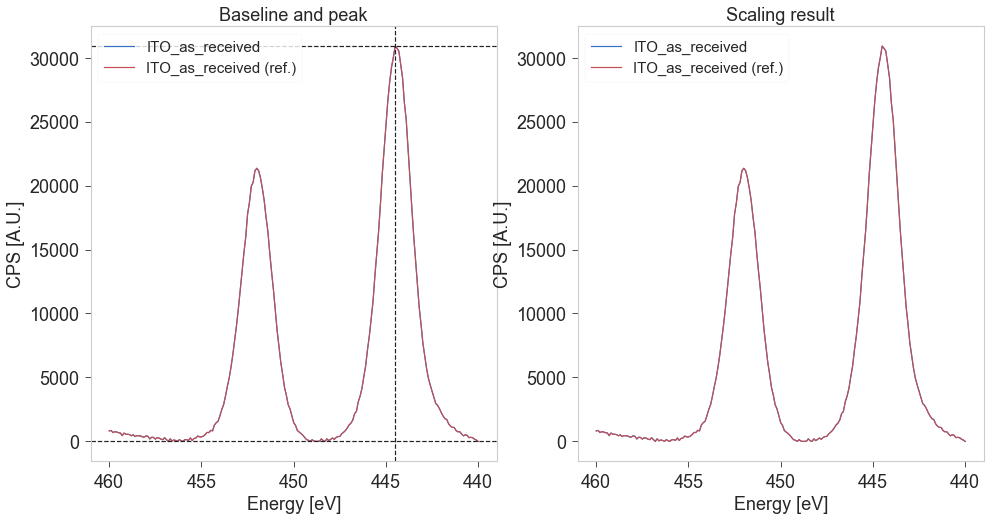

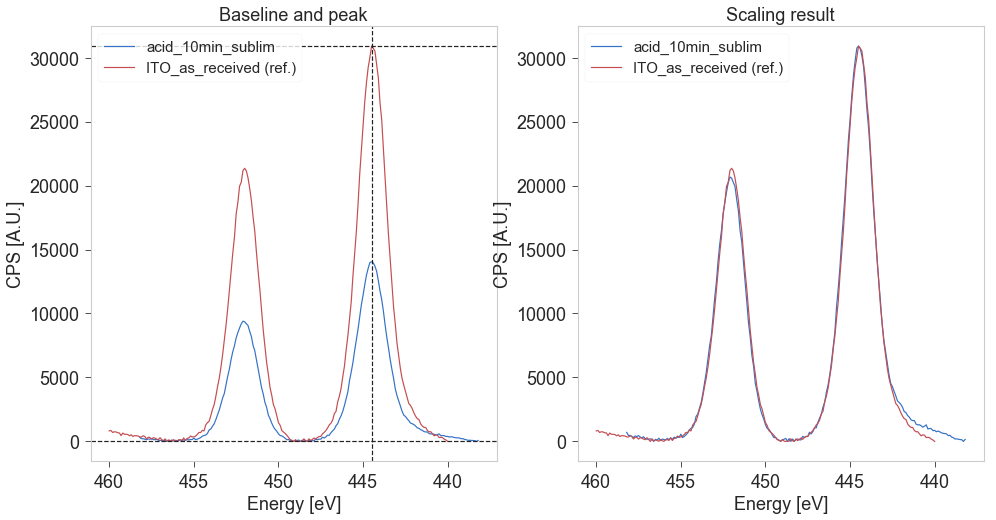

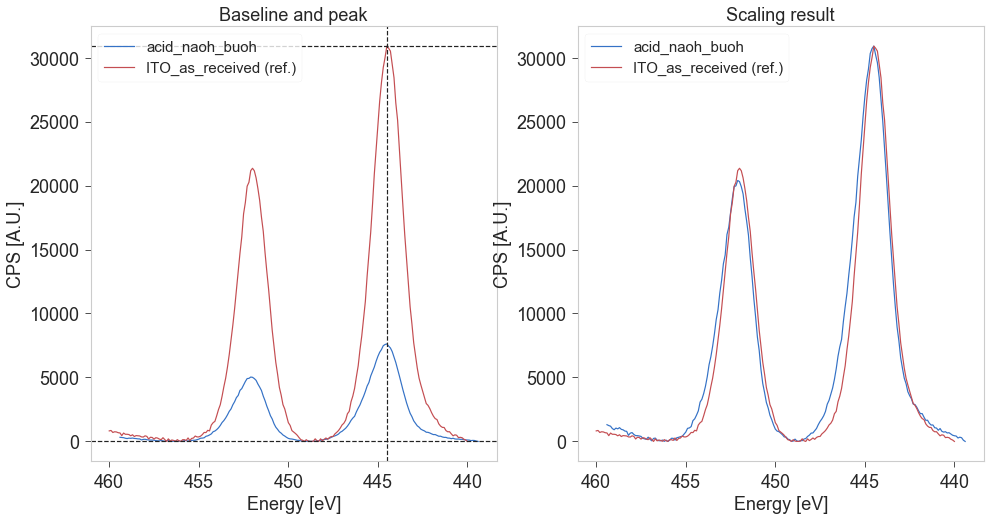

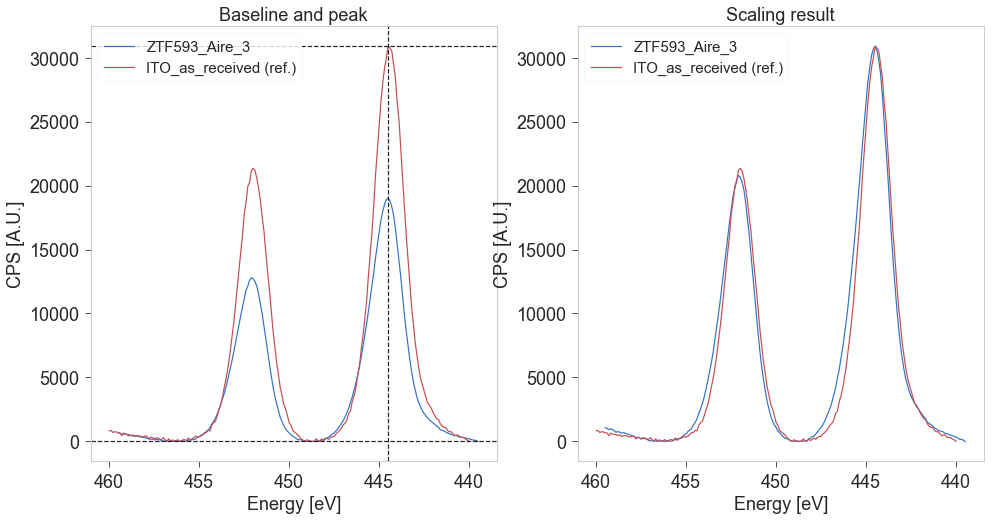

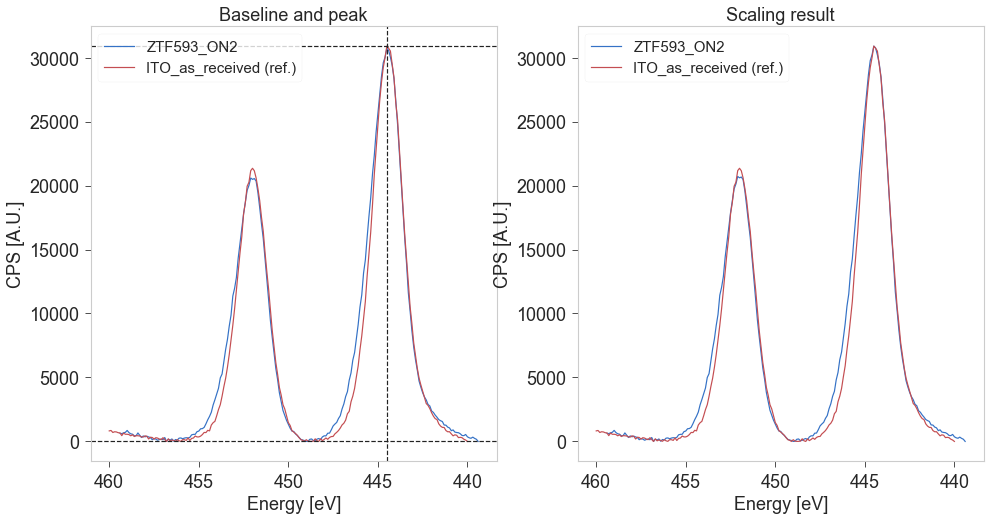

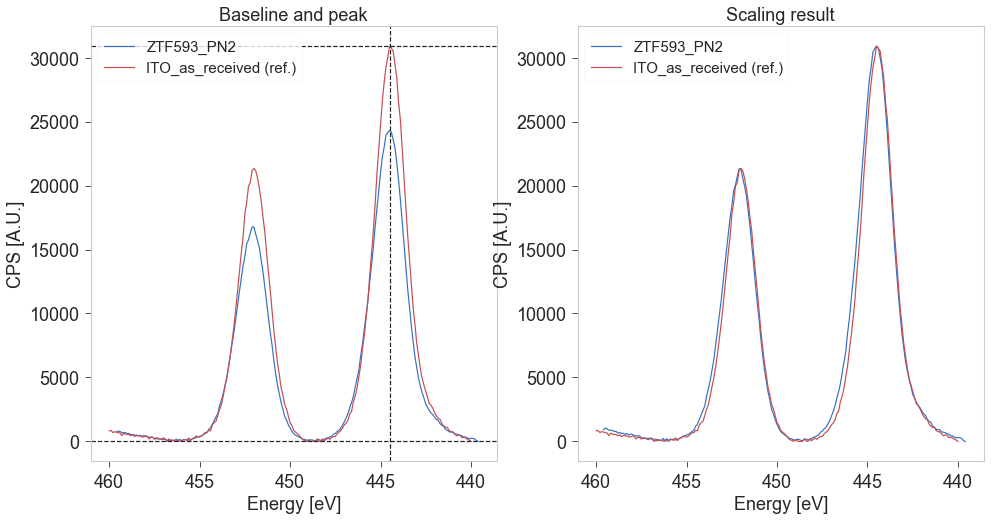

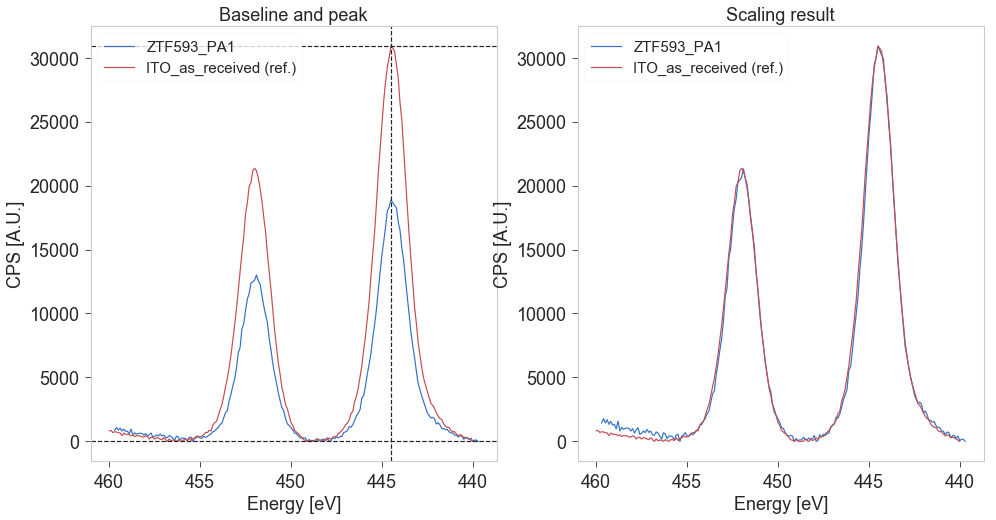

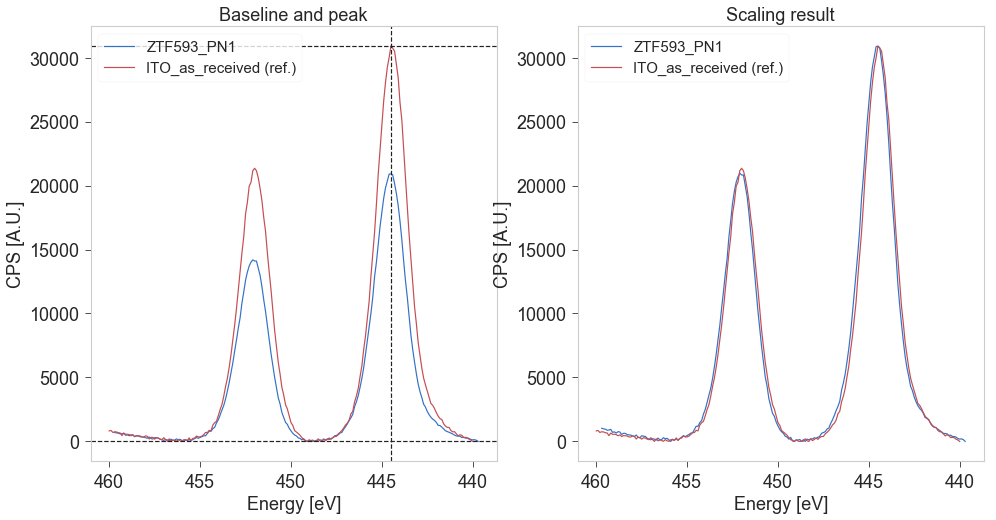

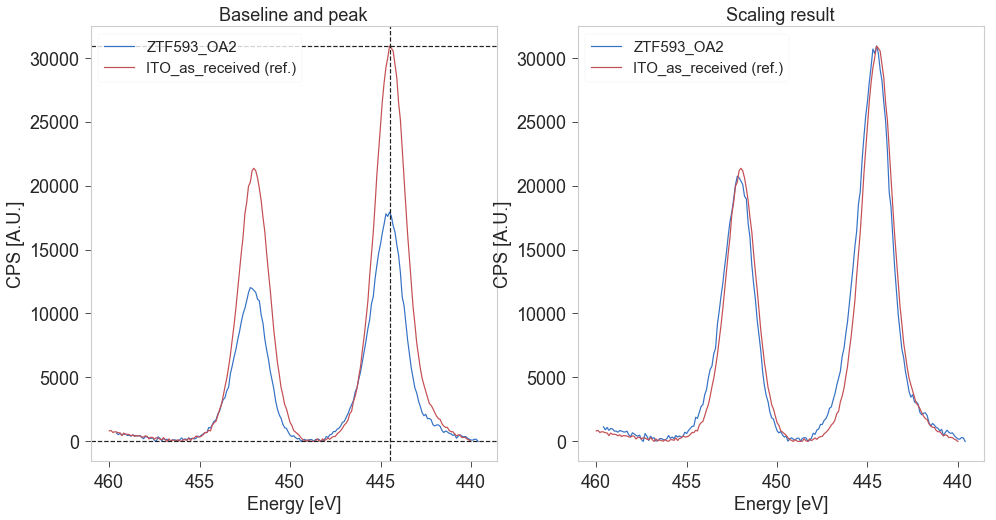

In [45]:
scaled_exps = []
for xpbg in bg_exps:
    scale = scale_and_plot_spectra(xp = xpbg, xpRef = bg_exps[0], region = 'In3d')
    scaled_exps.append(scale_dfx(xp = xpbg, scale_factor = scale))

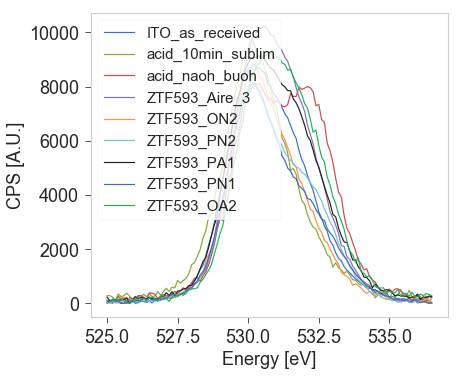

In [26]:
for xp in scaled_exps:
    plot_region(xp, 'O1s')
cosmetics_plot()

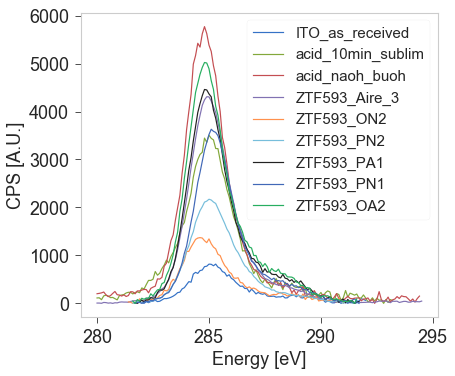

In [27]:
for xp in scaled_exps:
    plot_region(xp, 'C1s')
cosmetics_plot()

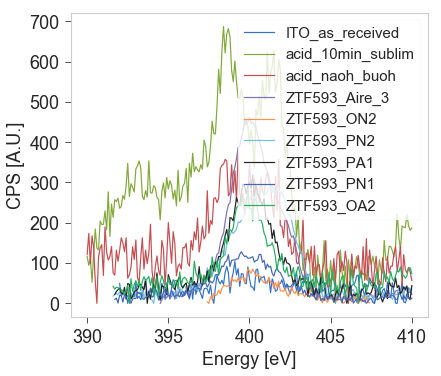

In [28]:
for xp in scaled_exps:
    plot_region(xp, 'N1s')
cosmetics_plot()

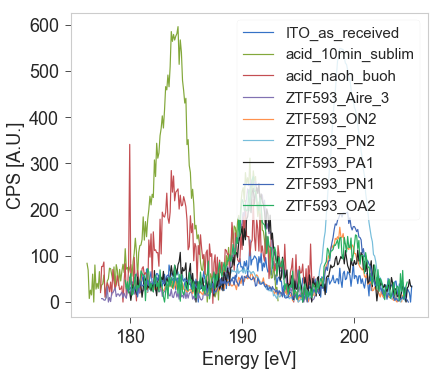

In [29]:
for xp in scaled_exps:
    plot_region(xp, 'Br3p')
cosmetics_plot()

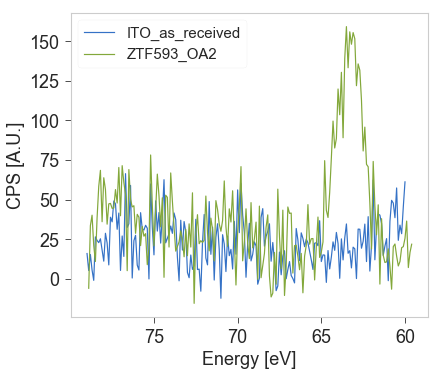

In [46]:
for xp in scaled_exps:
    try:
        plot_region(xp, 'Br3d')
    except KeyError:
        pass
cosmetics_plot()

## Store processed experiments

In [47]:
import os
for xp, xpProc in zip(experiments, scaled_exps):
    filepath, filename = os.path.split(xp.path)
    newpath = filepath + '/proc/'
    try:
        os.mkdir(newpath)
    except FileExistsError: pass
#     print(newpath + filename)
    write_processed_xp(newpath + filename, xpProc)

# SDEA
Silanized Double Elimination Addition anchoring to ITO

## Import data

In [93]:
path = '/Users/pabloherrero/sabat/xps_spectra/ITO_DEA/Zoraida_Hank/SDEA/*.xy'
files = glob.glob(path, recursive=True)
files.sort()
files_new = ['/Users/pabloherrero/sabat/xps_spectra/ITO_DEA/Zoraida_Hank/20201124_ITO_clean.xy',
             '/Users/pabloherrero/sabat/xps_spectra/ITO_DEA/sublim/ITO_DEA_acid/20200131_ITO_DEA_acid_10min_sublim.xy']

for f in files:
    files_new.append(f)

files = files_new
for f in files:
    print(os.path.split(f)[1])

20201124_ITO_clean.xy
20200131_ITO_DEA_acid_10min_sublim.xy
20201029_ITO_DEA_ZTF594_PN15_F1.xy
20201030_ITO_DEA_ZTF594_ON15_F1.xy
20201102_ITO_DEA_ZTF594_ON1_F1.xy
20201104_ITO_DEA_ZTF594_PN1_F1.xy


In [94]:
experiments = [xps_data_import(path=f) for f in files]
experiments[1].name

'ITO_DEA_acid_10min_sublim'

In [95]:
for xp in experiments[1:]:
    xp.name = xp.name.strip('ITO_DEA_')

### Change Br3p3/2 to Br3p

In [105]:
for xp in experiments:
    try:
        xp.dfx.rename_axis({'In3d5/2': 'In3d'}, axis=1, copy=False, inplace=True)
        xp.dfx.rename_axis({'Sn3d5/2': 'Sn3d'}, axis=1, copy=False, inplace=True)
        xp.dfx.rename_axis({'Br3p3/2': 'Br3p'}, axis=1, copy=False, inplace=True)
#         xp.dfx.rename_axis({'Br3p_(2)': 'Br3p'}, axis=1, copy=False, inplace=True)
    except KeyError:
        pass
experiments[3].dfx.rename_axis({'Br3p(2)': 'Br3p'}, axis=1, copy=False, inplace=True)

/Users/pabloherrero/anaconda3/envs/IC-3.7-2018-11-14/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Using 'rename_axis' to alter labels is deprecated. Use '.rename' instead
  This is separate from the ipykernel package so we can avoid doing imports until
/Users/pabloherrero/anaconda3/envs/IC-3.7-2018-11-14/lib/python3.7/site-packages/ipykernel_launcher.py:4: FutureWarning: Using 'rename_axis' to alter labels is deprecated. Use '.rename' instead
  after removing the cwd from sys.path.
/Users/pabloherrero/anaconda3/envs/IC-3.7-2018-11-14/lib/python3.7/site-packages/ipykernel_launcher.py:5: FutureWarning: Using 'rename_axis' to alter labels is deprecated. Use '.rename' instead
  """
/Users/pabloherrero/anaconda3/envs/IC-3.7-2018-11-14/lib/python3.7/site-packages/ipykernel_launcher.py:9: FutureWarning: Using 'rename_axis' to alter labels is deprecated. Use '.rename' instead
  if __name__ == '__main__':


In [97]:
experiments[0].dfx.rename_axis({'Cl2p': 'Br3p'}, axis=1, copy=False, inplace=True)

/Users/pabloherrero/anaconda3/envs/IC-3.7-2018-11-14/lib/python3.7/site-packages/ipykernel_launcher.py:1: FutureWarning: Using 'rename_axis' to alter labels is deprecated. Use '.rename' instead
  """Entry point for launching an IPython kernel.


In [107]:
experiments[4].dfx

range           overview          Br3p               N1s              Sn3d  \
properties        energy counts energy     counts energy     counts energy   
0           1.200000e+03  35080  205.0  1701.0756  412.0  1929.9535  506.0   
1           1.199000e+03  35245  204.9  1688.7791  411.9  1937.1163  505.9   
2           1.198000e+03  34750  204.8  1691.2209  411.8  1910.8372  505.8   
3           1.197000e+03  34915  204.7  1679.2733  411.7  1920.8837  505.7   
4           1.196000e+03  34395  204.6  1695.1744  411.6  1930.3256  505.6   
5           1.195000e+03  34000  204.5  1688.3721  411.5  1945.8605  505.5   
6           1.194000e+03  35160  204.4  1693.3721  411.4  1926.9302  505.4   
7           1.193000e+03  33575  204.3  1694.5930  411.3  1921.6744  505.3   
8           1.192000e+03  34125  204.2  1681.9186  411.2  1913.2093  505.2   
9           1.191000e+03  34240  204.1  1702.0349  411.1  1927.0698  505.1   
10          1.190000e+03  33970  204.0  1709.2733  411.0  1913.5349  505.0   
11          1.189000e+03  33310  203.9  1690.0581  410.9  1909.9070  504.9   
12          1.188000e+03  33360  203.8  1701.3953  410.8  1921.7674  504.8   
13          1.187000e+03  32870  203.7  1700.8140  410.7  1914.0000  504.7   
14          1.186000e+03  33115  203.6  1696.9186  410.6  1911.6744  504.6   
15          1.185000e+03  32980  203.5  1700.2326  410.5  1899.1163  504.5   
16          1.184000e+03  32085  203.4  1698.3721  410.4  1909.1628  504.4   
17          1.183000e+03  33375  203.3  1712.1512  410.3  1913.8140  504.3   
18          1.182000e+03  32590  203.2  1703.5174  410.2  1916.2326  504.2   
19          1.181000e+03  31990  203.1  1698.6047  410.1  1914.1860  504.1   
20          1.180000e+03  31810  203.0  1718.0814  410.0  1903.7674  504.0   
21          1.179000e+03  31940  202.9  1718.8953  409.9  1921.3953  503.9   
22          1.178000e+03  32715  202.8  1725.1453  409.8  1902.9767  503.8   
23          1.177000e+03  31945  202.7  1699.4767  409.7  1903.9535  503.7   
24          1.176000e+03  32330  202.6  1715.5233  409.6  1897.2093  503.6   
25          1.175000e+03  31715  202.5  1730.8140  409.5  1913.0698  503.5   
26          1.174000e+03  31395  202.4  1715.7558  409.4  1897.0233  503.4   
27          1.173000e+03  31380  202.3  1728.4302  409.3  1909.7209  503.3   
28          1.172000e+03  31140  202.2  1725.9302  409.2  1890.0930  503.2   
29          1.171000e+03  32045  202.1  1719.6221  409.1  1900.3256  503.1   
...                  ...    ...    ...        ...    ...        ...    ...   
1175        2.500000e+01   2950    NaN        NaN    NaN        NaN    NaN   
1176        2.400000e+01   2795    NaN        NaN    NaN        NaN    NaN   
1177        2.300000e+01   2930    NaN        NaN    NaN        NaN    NaN   
1178        2.200000e+01   3020    NaN        NaN    NaN        NaN    NaN   
1179        2.100000e+01   4090    NaN        NaN    NaN        NaN    NaN   
1180        2.000000e+01   7245    NaN        NaN    NaN        NaN    NaN   
1181        1.900000e+01  11550    NaN        NaN    NaN        NaN    NaN   
1182        1.800000e+01  11245    NaN        NaN    NaN        NaN    NaN   
1183        1.700000e+01   6370    NaN        NaN    NaN        NaN    NaN   
1184        1.600000e+01   2985    NaN        NaN    NaN        NaN    NaN   
1185        1.500000e+01   1815    NaN        NaN    NaN        NaN    NaN   
1186        1.400000e+01   1690    NaN        NaN    NaN        NaN    NaN   
1187        1.300000e+01   1690    NaN        NaN    NaN        NaN    NaN   
1188        1.200000e+01   1565    NaN        NaN    NaN        NaN    NaN   
1189        1.100000e+01   1665    NaN        NaN    NaN        NaN    NaN   
1190        1.000000e+01   2020    NaN        NaN    NaN        NaN    NaN   
1191        9.000000e+00   2490    NaN        NaN    NaN        NaN    NaN   
1192        8.000000e+00   2750    NaN        NaN    NaN        NaN    NaN   
1193        7.000000e+

## Crop and align In 3d to reference ITO BE
According to Moulder Handbook, In$_2$O$_3$ has In 3d5/2 on 444.5 eV

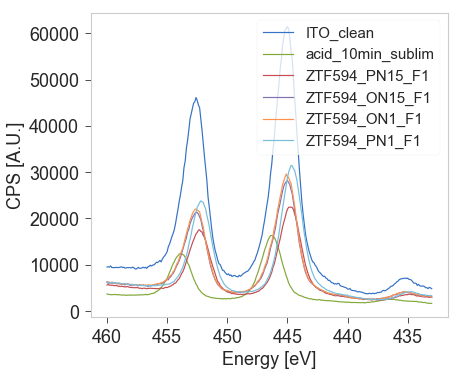

In [98]:
region = 'In3d'
for xp in experiments:
    plot_region(xp, region)
cosmetics_plot()

/Users/pabloherrero/sabat/sabatsw/xps/xps_analysis.py:64: RuntimeWarning: invalid value encountered in greater
  dropup = np.where(xp.dfx[region].energy.values > eup)[0]


Text(0.5, 1.0, 'In 3d')

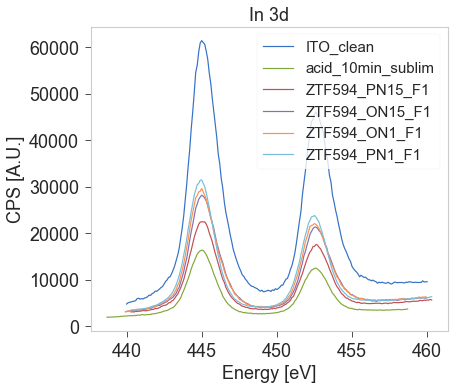

In [109]:
region = 'In3d'
aligned_exps = []

for xp in experiments:
    xp_new = crop_spectrum(xp, region=region, eup=None, edw=440)
    
    shift = find_shift(xp_new, xpRef=experiments[0], region=region)
    align_dfx(xp_new, shift, inplace = True)
    aligned_exps.append(xp_new)
    plot_region(xp_new, region)
plt.title('In 3d')

## BG subtraction

### Subtract double shirley to all In 3d regions

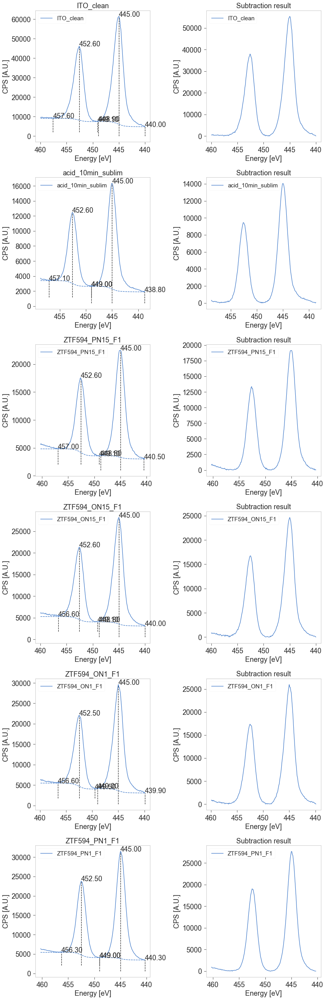

In [117]:
region = 'In3d'

bg_exps = region_2bg_subtract(aligned_exps, region=region, xlim=449)

### Bulk subtract background

In [111]:
experiments[1].dfx.columns.levels[0]

Index(['Br3p', 'C1s', 'In3d', 'N1s', 'O1s', 'Sn3d', 'overview'], dtype='object', name='range')

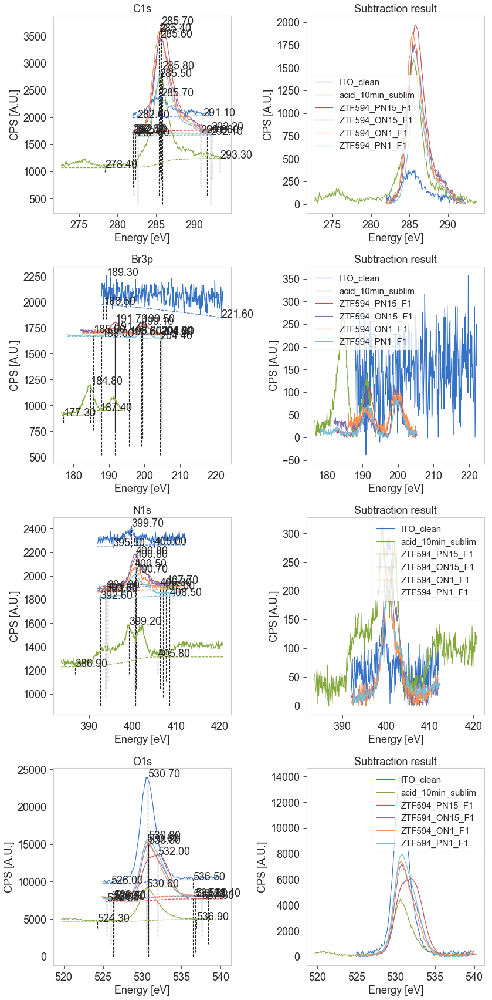

In [118]:
regions = ['C1s', 'Br3p', 'N1s', 'O1s']
bg_exps = bulk_bg_subtract(bg_exps, regions)

### Sn 3d: refine double shirley

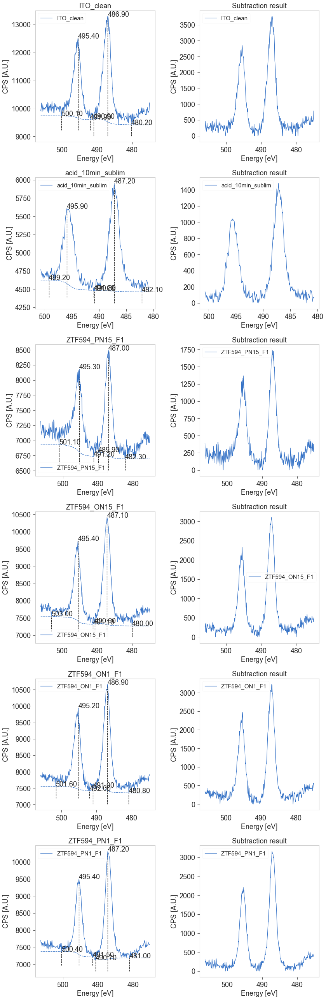

In [119]:
bg_exps = region_2bg_subtract(bg_exps, region='Sn3d', xlim=491, )

### Br 3p: refine double shirley

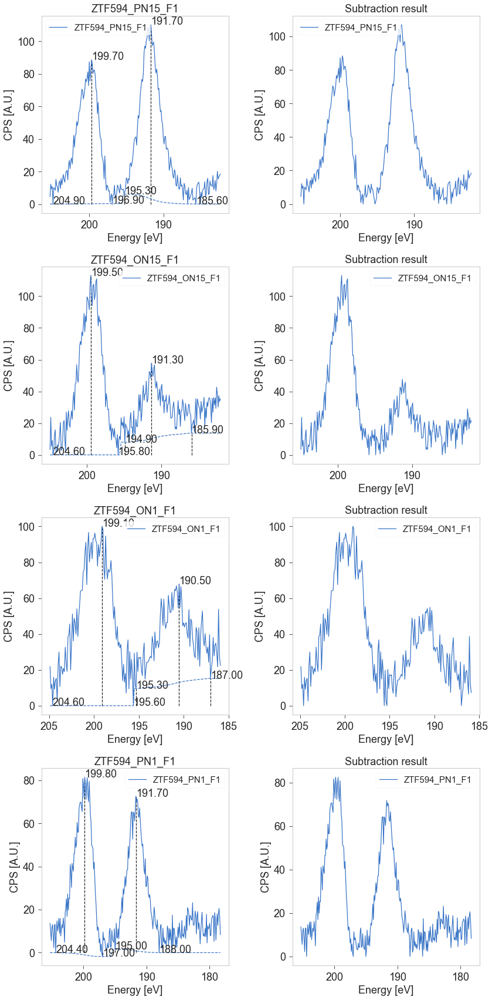

In [120]:
region = 'Br3p'
bg_exps[2:] = region_2bg_subtract(bg_exps[2:], region, xlim=195.5)

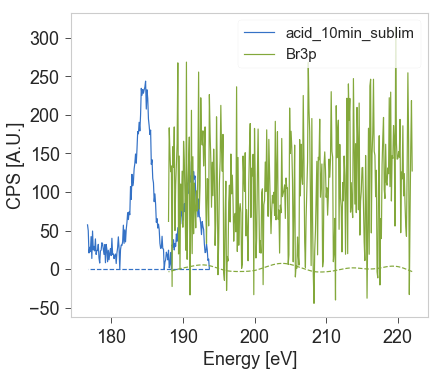

In [124]:
bg_exps[1] = subtract_double_shirley(bg_exps[1], region, xlim=187.5)
bg_exps[0] = subtract_als_bg(bg_exps[0], region)

### Si 2p

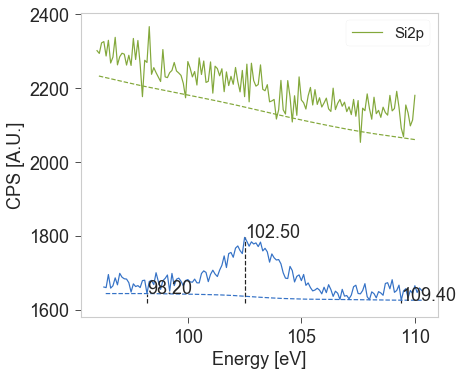

In [125]:
region = 'Si2p'
bg_exps[5] = subtract_shirley_bg(bg_exps[5], region=region)
bg_exps[0] = subtract_als_bg(bg_exps[0], region=region)

### Plot result of bulk subtract

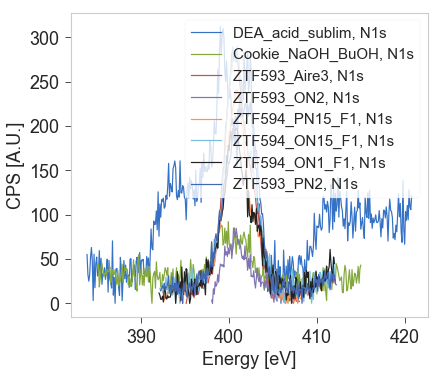

In [320]:
region = 'N1s'
for xp in bg_exps:
    plot_region(xp, region)

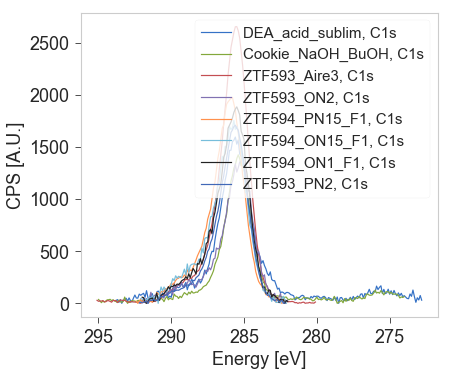

In [321]:
region = 'C1s'
for xp in bg_exps:
    plot_region(xp, region)
cosmetics_plot()

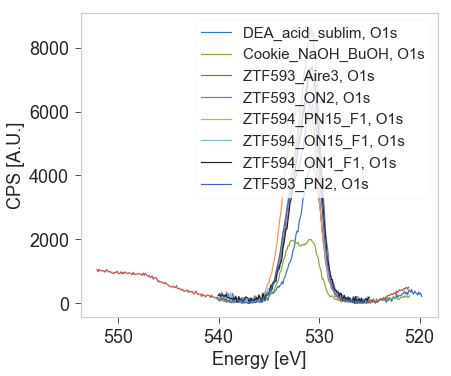

In [322]:
region = 'O1s'
for xp in bg_exps:
    plot_region(xp, region)
cosmetics_plot()

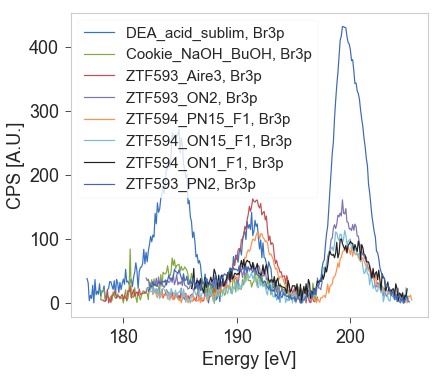

In [323]:
region = 'Br3p'
for xp in bg_exps:
    plot_region(xp, region)
# cosmetics_plot()

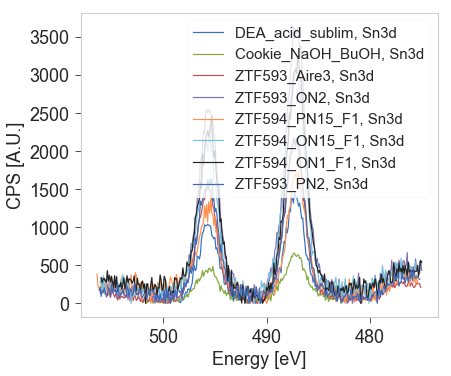

In [324]:
region = 'Sn3d'
for xp in bg_exps:
    plot_region(xp, region)
cosmetics_plot()

### Trim O, N, C 1s regions

/Users/pabloherrero/sabat/sabatsw/xps/xps_analysis.py:64: RuntimeWarning: invalid value encountered in greater
  dropup = np.where(xp.dfx[region].energy.values > eup)[0]


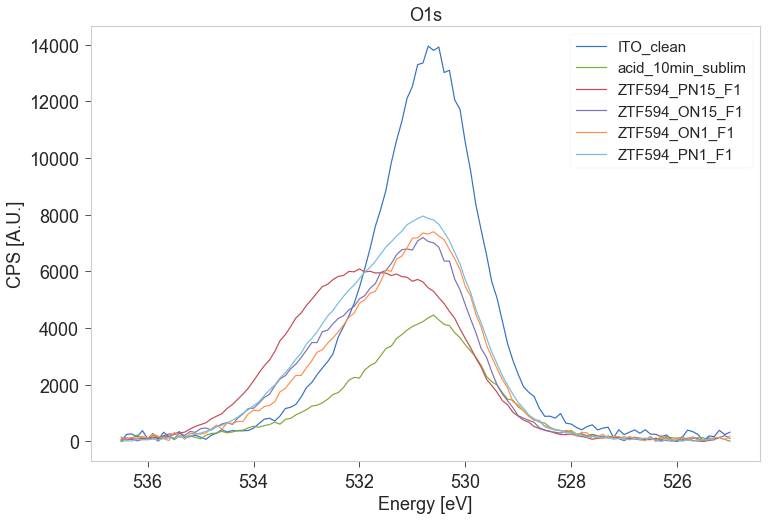

In [126]:
region = 'O1s'
fig, ax = plt.subplots(1, figsize=(12, 8))
new_exps = []
for xp in bg_exps:
    xp_crop = crop_spectrum(xp, region, eup=536.5, edw=525)
    plot_region(xp_crop, region)
    new_exps.append(xp_crop)
cosmetics_plot()
ax.set(title=region)
bg_exps = new_exps

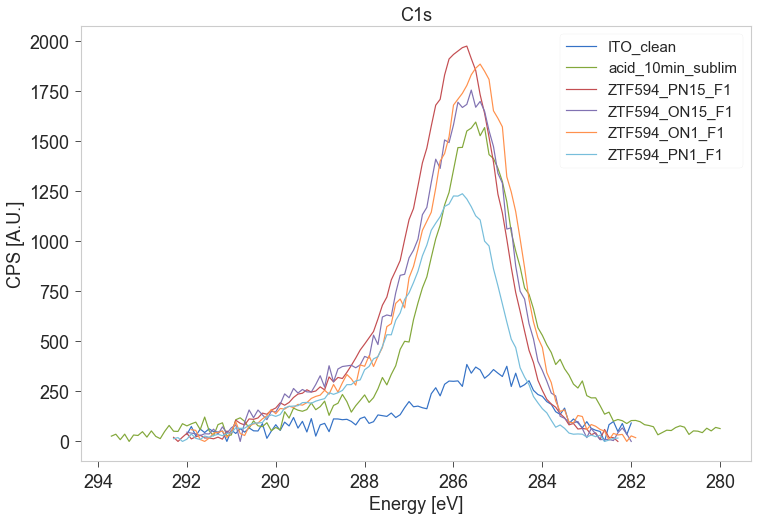

In [127]:
region = 'C1s'
fig, ax = plt.subplots(1, figsize=(12, 8))
new_exps = []
for xp in bg_exps:
    xp_crop = crop_spectrum(xp, region,  eup=None, edw=280)
    plot_region(xp_crop, region)
    new_exps.append(xp_crop)
cosmetics_plot()
ax.set(title=region)
bg_exps = new_exps

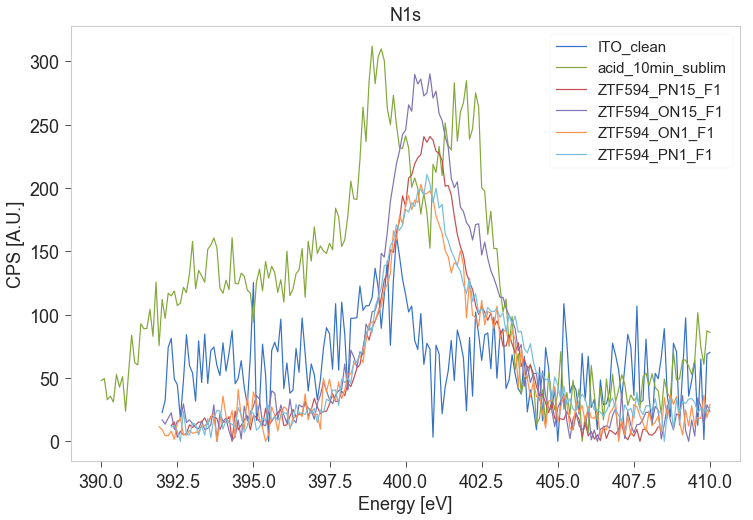

In [128]:
region = 'N1s'
fig, ax = plt.subplots(1, figsize=(12, 8))
new_exps = []
for xp in bg_exps:
    xp_crop = crop_spectrum(xp, region, eup=410, edw=390)
    plot_region(xp_crop, region)
    new_exps.append(xp_crop)
# cosmetics_plot()
ax.set(title=region)
bg_exps = new_exps

## Inspect overview

[Text(0.5, 1.0, 'Ta 5d region')]

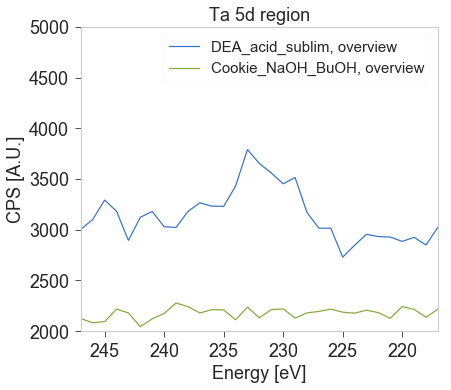

In [284]:
plot_region(experiments[0], region='overview')
plot_region(experiments[1], region='overview')

plt.gca().set_xlim(247, 217)
plt.gca().set_ylim(2000, 5e3)
plt.gca().set(title='Ta 5d region')

[Text(0.5, 1.0, 'Br 3p region')]

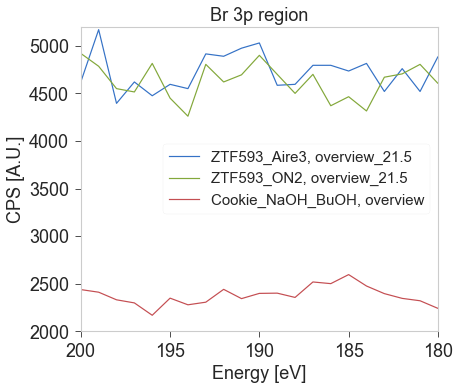

In [285]:
plot_region(experiments[2], region='overview_21.5')
plot_region(experiments[3], region='overview_21.5')

plot_region(experiments[1], region='overview')

plt.gca().set_xlim(200, 180)
plt.gca().set_ylim(2000, 5.2e3)
plt.gca().set(title='Br 3p region')

## Scale to In 3d

/Users/pabloherrero/anaconda3/envs/IC-3.7-2018-11-14/lib/python3.7/site-packages/numpy/core/fromnumeric.py:56: FutureWarning: 'argmin' is deprecated, use 'idxmin' instead. The behavior of 'argmin'
will be corrected to return the positional minimum in the future.
Use 'series.values.argmin' to get the position of the minimum now.
  return getattr(obj, method)(*args, **kwds)


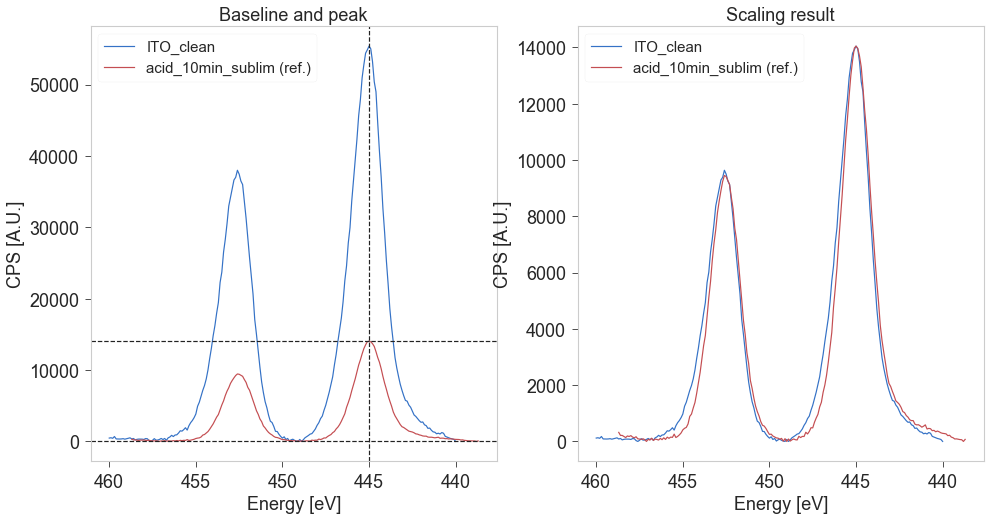

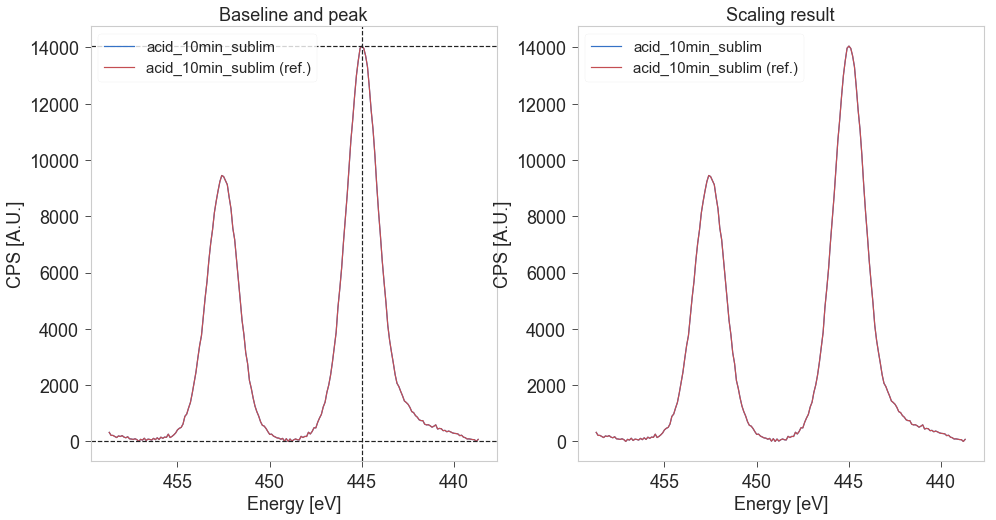

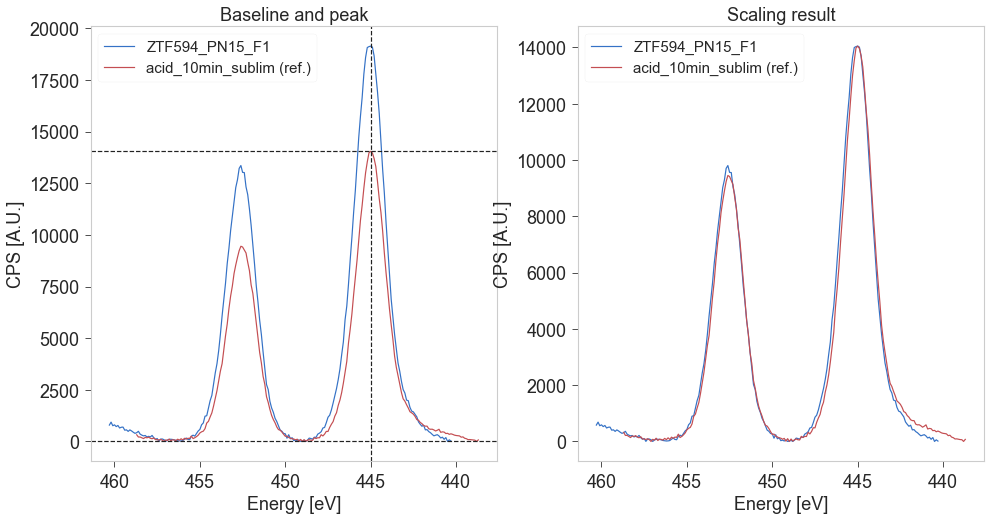

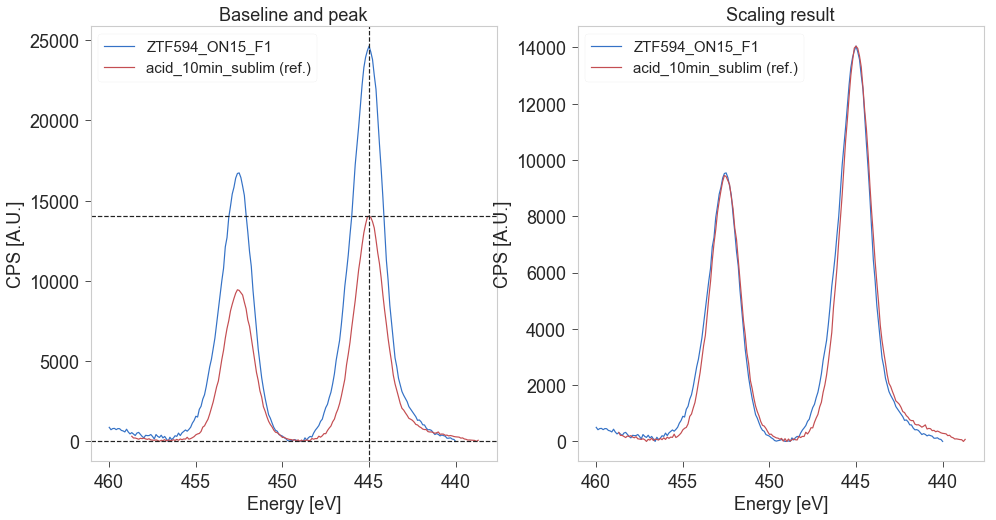

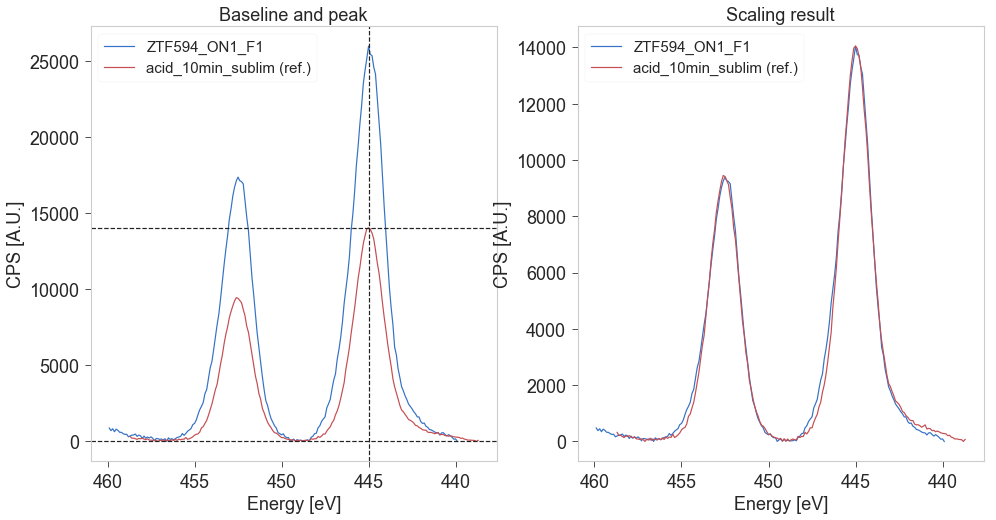

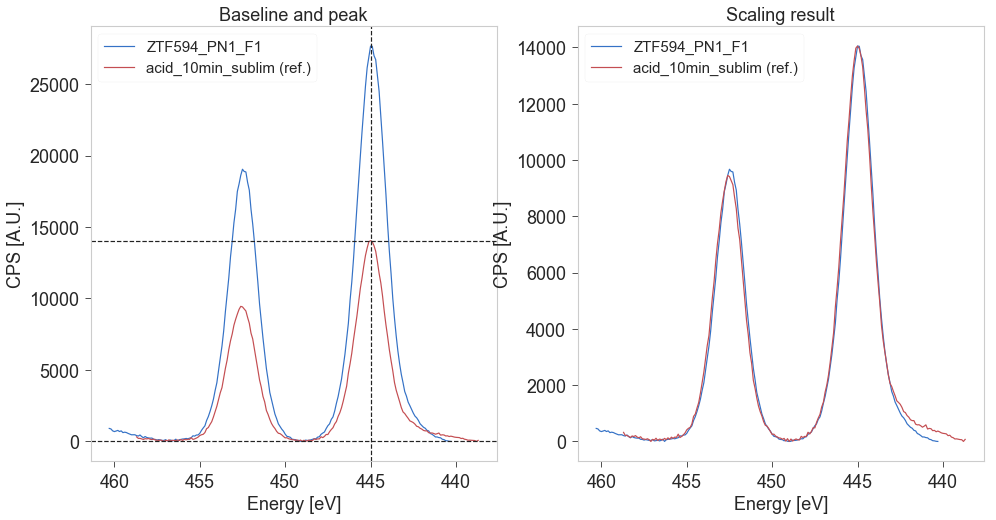

In [143]:
scaled_exps = []
for xpbg in bg_exps:
    scale = scale_and_plot_spectra(xp = xpbg, xpRef = bg_exps[1], region = 'In3d')
    scaled_exps.append(scale_dfx(xp = xpbg, scale_factor = scale))

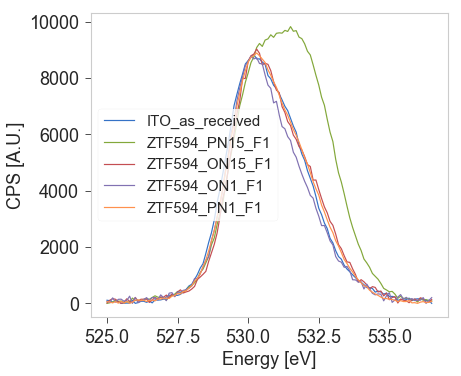

In [72]:
for xp in scaled_exps:
    plot_region(xp, 'O1s')
cosmetics_plot()

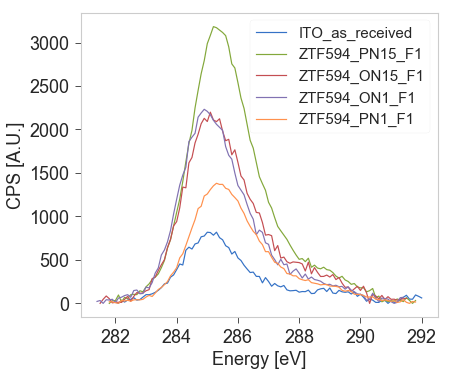

In [73]:
for xp in scaled_exps:
    plot_region(xp, 'C1s')
cosmetics_plot()

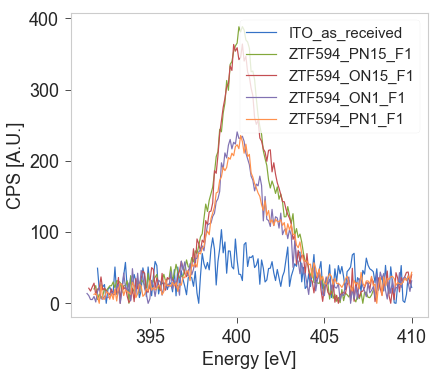

In [71]:
for xp in scaled_exps:
    plot_region(xp, 'N1s')
cosmetics_plot()

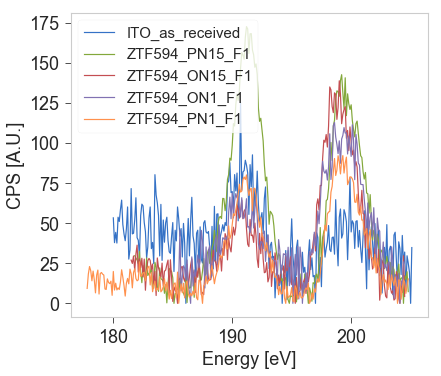

In [20]:
for xp in scaled_exps:
    plot_region(xp, 'Br3p')
cosmetics_plot()

## Compare clean ITO and ZTF594_PN1_F1

### Compress N1s and Br 3p 

XPS_experiment(path='/Users/pabloherrero/sabat/xps_spectra/ITO_DEA/Zoraida_Hank/20201124_ITO_clean.xy', delimiters=([42, 1275, 1504, 1843, 2142, 2271, 2450, 2619, 2988], [1205, 201, 311, 271, 101, 151, 141, 341, 461], ['overview', 'N1s', 'Sn3d', 'In3d', 'C1s', 'O1s', 'Si2p', 'Cl2p', 'Ba3d']), name='ITO_clean', label='20201124_ITO_clean', date='2020.11.24', other_meta='ITO_clean', dfx=       Ba3d            Br3p                C1s               In3d              \
     energy   counts energy      counts energy      counts energy      counts   
0     816.0  12332.0  222.0  130.645080  292.0   35.000000  460.0  470.000000   
1     815.9  12604.0  221.9  221.648641  291.9   74.500000  459.9  516.000000   
2     815.8  12474.0  221.8  160.651945  291.8   27.500000  459.8  436.000000   
3     815.7  12674.0  221.7   71.654292  291.7   61.500000  459.7  688.000000   
4     815.6  12550.0  221.6  -31.345334  291.6   44.500000  459.6  350.000000   
5     815.5  12376.0  221.5  169.386269  291.5

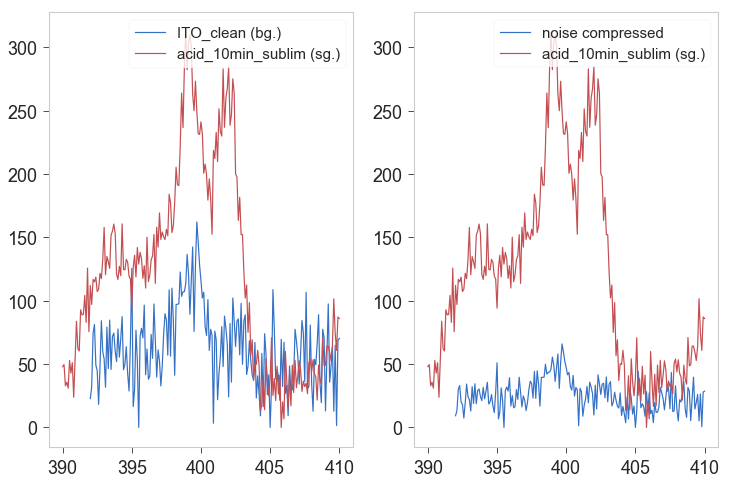

In [130]:
compress_noisy_region(bg_exps[0], bg_exps[1], region='N1s', inplace=True);

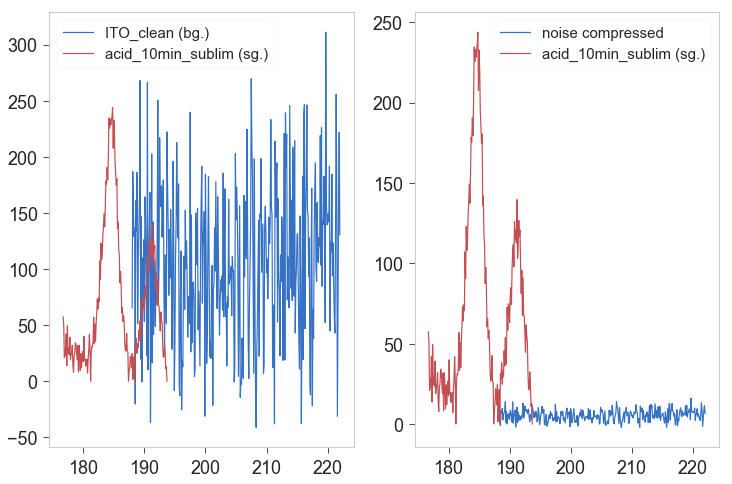

In [131]:
compress_noisy_region(bg_exps[0], bg_exps[1], region='Br3p', inplace=True);

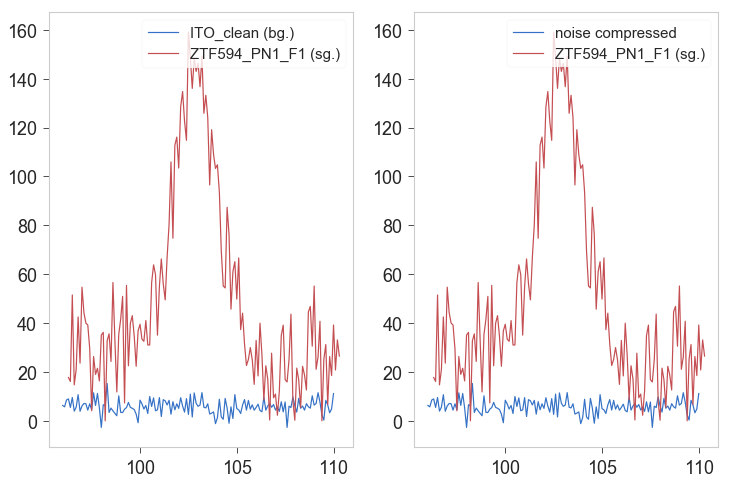

In [135]:
compress_noisy_region(bg_exps[0], bg_exps[5], region='Si2p', inplace=True);

### Region plot

In [83]:
def plot_xp_regions(experiments : list, regions : list, ncols: int = 3):
    """Subplots all regions of a list of experiments (unnormalised)"""
    rows = int(np.ceil(len(regions) / ncols))

    fig, ax = plt.subplots(rows, ncols, figsize=(16, 8))
    for i,r in enumerate(regions):
            for c,xp in enumerate(experiments):
                j, k = i//ncols, i%ncols
                if i == len(regions) - 1:   # Set labels from last region
                    lb = xp.name
                else:
                    lb='__nolabel__'
                
                try:
                    li = plot_region(xp, r, ax=ax[j][k], lb=lb)
                except KeyError:
                    pass
                
                ax[j][k].set_title(r)
                leg = ax[j][k].get_legend()
                if leg is not None: leg.remove()
                cosmetics_plot(ax=ax[j][k], leg = False);
                
            if len(experiments)%2 == 0:
                ax[j][k].invert_xaxis()
    fig.legend(loc='upper right', bbox_to_anchor=(1.12, 0.5), fontsize=16)
#     plt.tight_layout()

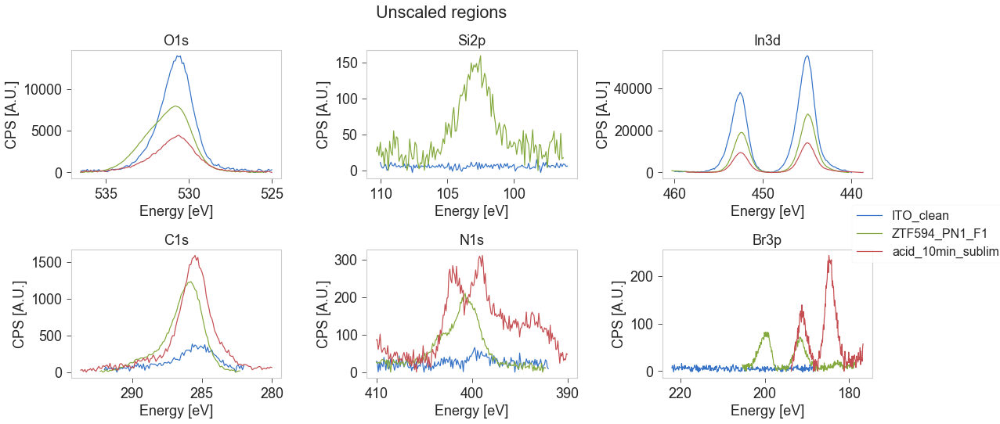

In [139]:
regions= ['O1s', 'Si2p', 'In3d', 'C1s', 'N1s', 'Br3p']
plot_xp_regions([bg_exps[0], bg_exps[5], bg_exps[1]], regions)
plt.gcf().suptitle('Unscaled regions', )
plt.gca().invert_xaxis()

plt.gcf().tight_layout(rect=[0, 0.03, 1, 0.95])
# plt.savefig('/Users/pabloherrero/sabat/xps_spectra/ITO_DEA/Zoraida_Hank/ZF594_PN1_F1_unscaled.png', dpi=100)

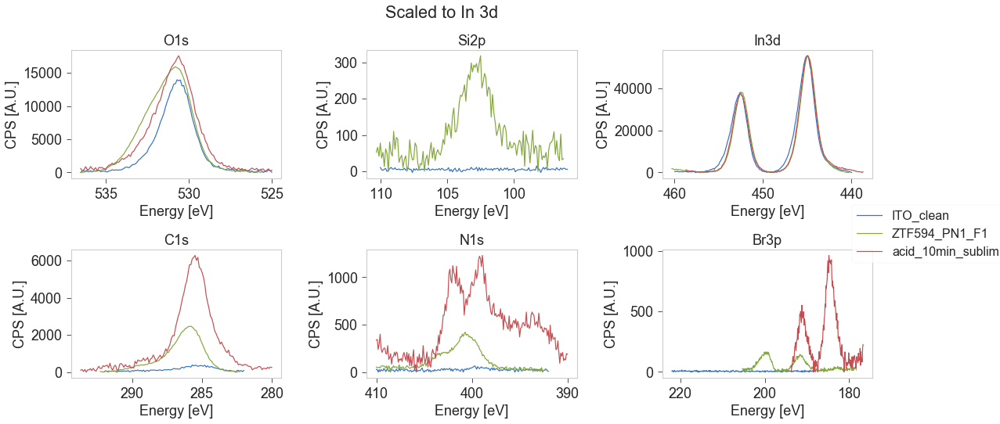

In [138]:
regions= ['O1s', 'Si2p', 'In3d', 'C1s', 'N1s', 'Br3p']
plot_xp_regions([scaled_exps[0], scaled_exps[5], scaled_exps[1]], regions)
plt.gca().invert_xaxis()
plt.gcf().suptitle('Scaled to In 3d')
plt.gcf().tight_layout(rect=[0, 0.03, 1, 0.95])
# plt.savefig('/Users/pabloherrero/sabat/xps_spectra/ITO_DEA/Zoraida_Hank/ZF594_PN1_F1_scaled.png', dpi=100)

## Store processed experiments

In [74]:
import os
for xp, xpProc in zip(experiments[1:], scaled_exps[1:]):
    filepath, filename = os.path.split(xp.path)
    newpath = filepath + '/proc/'
    try:
        os.mkdir(newpath)
    except FileExistsError: pass
#     print(newpath + filename)
    write_processed_xp(newpath + filename, xpProc)

In [144]:
filepath, filename = os.path.split(experiments[0].path)
newpath = filepath + '/proc/'
write_processed_xp(newpath + filename, scaled_exps[0])

# APTES data

In [130]:
path = '/Users/pabloherrero/sabat/xps_spectra/ITO_DEA/Zoraida_Hank/APTES/*.xy'
files = glob.glob(path, recursive=True)
files.sort()
files_new = ['/Users/pabloherrero/sabat/xps_spectra/ITO_DEA/Zoraida_Hank/20201106_ITO_as_received.xy']

for f in files:
    files_new.append(f)

files = files_new
for f in files:
    print(os.path.split(f)[1])

20201106_ITO_as_received.xy
20201102_ITO_DEA_ZTF594_PA15.xy
20201103_ITO_DEA_ZTF594_PA15_rep.xy
20201104_ITO_DEA_ZTF594_OA1.xy
20201104_ITO_DEA_ZTF594_OA15.xy
20201105_ITO_DEA_ZTF594_PA1.xy


In [131]:
experiments = [xps_data_import(path=f) for f in files]
experiments[1].name

'ITO_DEA_ZTF594_PA15'

In [132]:
for xp in experiments[1:]:
    xp.name = xp.name.strip('ITO_DEA_')

## Align from In 3d

Text(0.5, 1.0, 'In 3d')

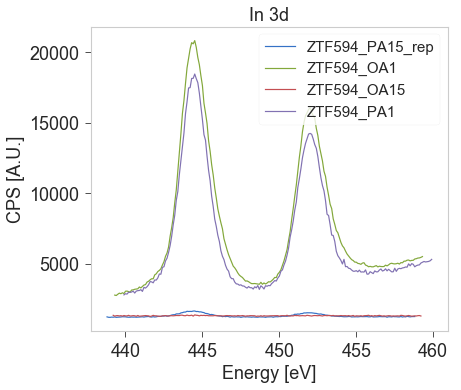

In [133]:
region = 'In3d'
aligned_exps = experiments[:2]

for xp in experiments[2:]:
    xp_new = crop_spectrum(xp, region=region, eup=None, edw=440)
    
    shift = find_shift(xp_new, xpRef=bg_exps[0], region=region)
    align_dfx(xp_new, shift, inplace = True)
    aligned_exps.append(xp_new)
    plot_region(xp_new, region)
plt.title('In 3d')

## Bg subtraction

### In 3d

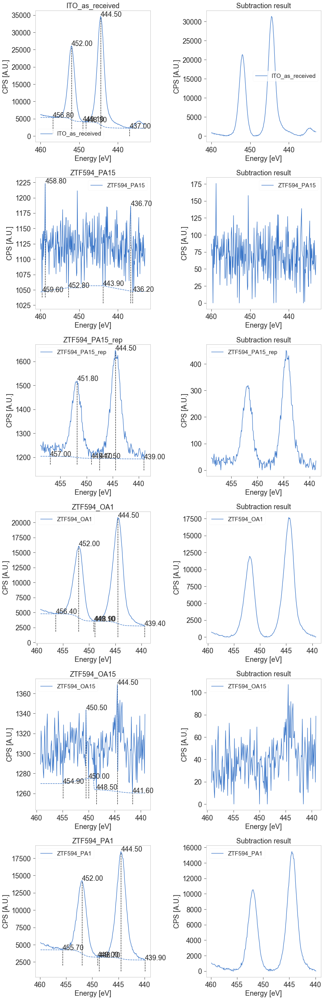

In [134]:
region = 'In3d'
bg_exps = region_2bg_subtract(aligned_exps, region, xlim=449)

### Sn 3d

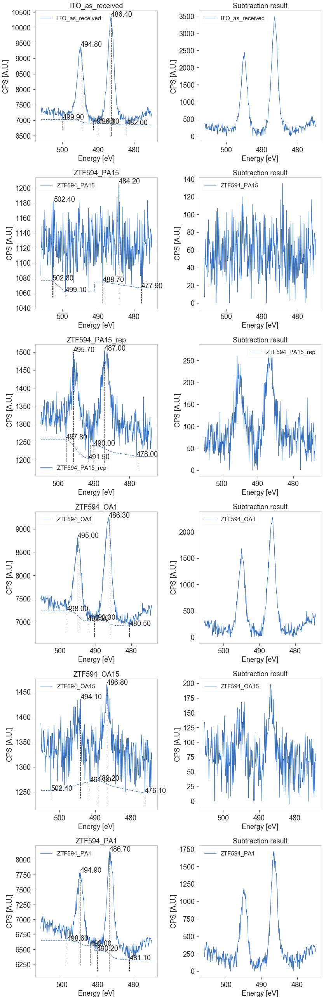

In [135]:
region = 'Sn3d'
bg_exps = region_2bg_subtract(bg_exps, region, xlim=491)

### C, N, O and Br

Max iterations exceeded, subtract ALS baseline


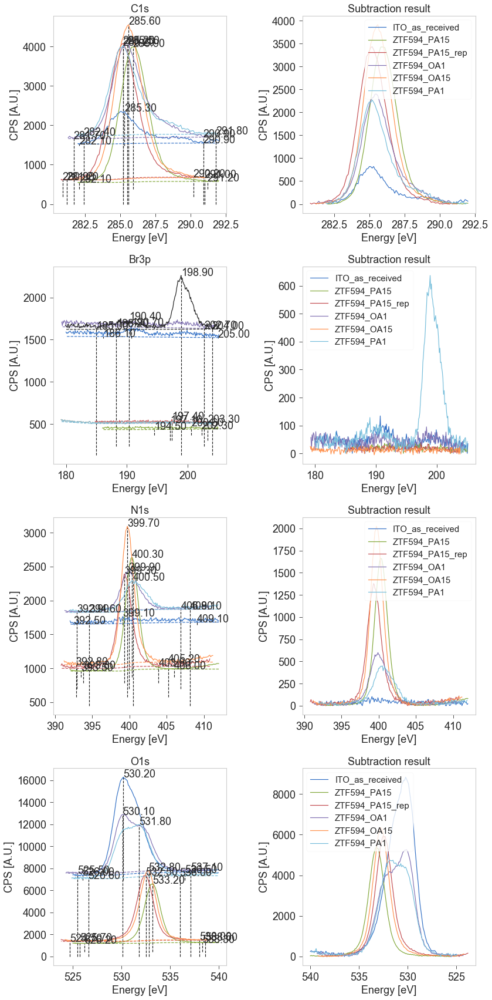

In [136]:
regions = ['C1s', 'Br3p', 'N1s', 'O1s']
bg_exps = bulk_bg_subtract(bg_exps, regions)

### Si 2p

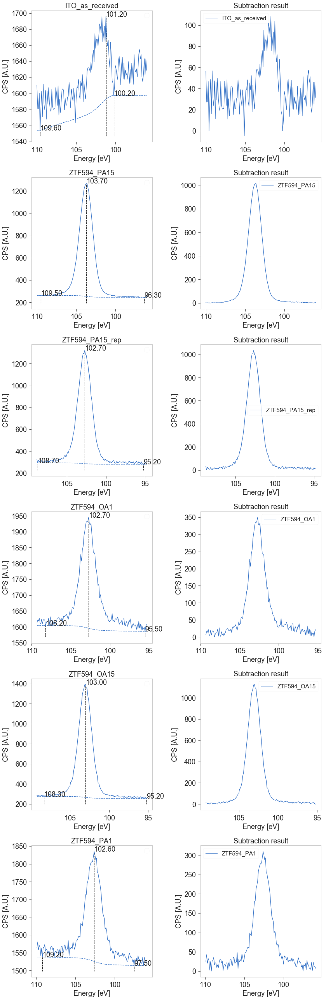

In [137]:
region = 'Si2p'
bg_exps = region_bg_subtract(bg_exps, region)

## Store processed experiments

In [138]:
import os
for xp, xpProc in zip(experiments[1:], bg_exps[1:]):
    filepath, filename = os.path.split(xp.path)
    newpath = filepath + '/proc/'
    try:
        os.mkdir(newpath)
    except FileExistsError: pass
#     print(newpath + filename)
    write_processed_xp(newpath + filename, xpProc)

# DEA powder data
Not on ITO but stuck with carbon strip.

In [7]:
path = '/Users/pabloherrero/sabat/xps_spectra/ITO_DEA/Zoraida_Hank/20201117*.xy'
files = glob.glob(path, recursive=True)
files.sort()
files_new = []

for f in files:
    files_new.append(f)

files = files_new
for f in files:
    print(os.path.split(f)[1])

20201117_powder_DEA_BD563.xy
20201117_powder_DEA_BD572.xy


In [8]:
experiments = [xps_data_import(path=f) for f in files]
experiments[1].name

'powder_DEA_BD572'

## Bg subtraction

### C, N, O and Br

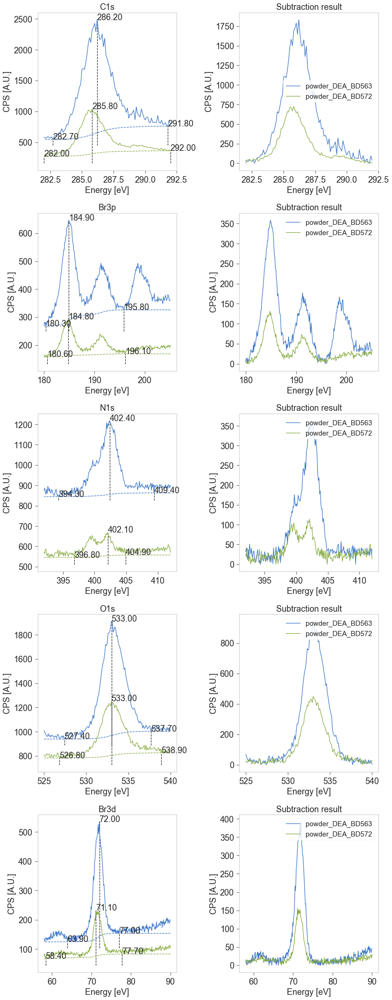

In [12]:
regions = ['C1s', 'Br3p', 'N1s', 'O1s', 'Br3d']
bg_exps = bulk_bg_subtract(experiments, regions)

### Refine Cl 2p bg

XPS_experiment(path='/Users/pabloherrero/sabat/xps_spectra/ITO_DEA/Zoraida_Hank/20201117_powder_DEA_BD563.xy', delimiters=([42, 1275, 1555, 1784, 1953, 2082, 2261, 2610, 2949], [1205, 252, 201, 141, 101, 151, 321, 311, 12041], ['overview', 'Br3p', 'N1s', 'Br3p_(2)', 'C1s', 'O1s', 'Br3d', 'Na1s', 'overview_HD']), name='powder_DEA_BD563', label='20201117_powder_DEA_BD563', date='2020.11.17', other_meta='powder_DEA_BD563', dfx=range      overview           Br3p              N1s            Br3p_(2)  \
properties   energy  counts energy    counts energy     counts   energy   
0            1200.0  6045.0  205.1  34.16667  412.0  37.333330    180.0   
1            1199.0  5835.0  205.0  34.33334  411.9  23.866660    179.9   
2            1198.0  5655.0  204.9  32.50000  411.8  37.333330    179.8   
3            1197.0  5480.0  204.8  44.50000  411.7  39.600000    179.7   
4            1196.0  5690.0  204.7  50.33334  411.6  20.800000    179.6   
5            1195.0  5775.0  204.6  54.50000  4

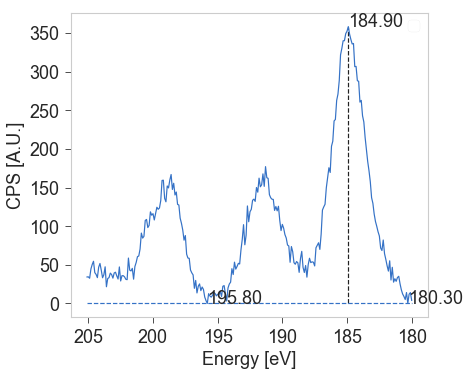

In [11]:
subtract_shirley_bg(bg_exps[0], region='Br3p', )

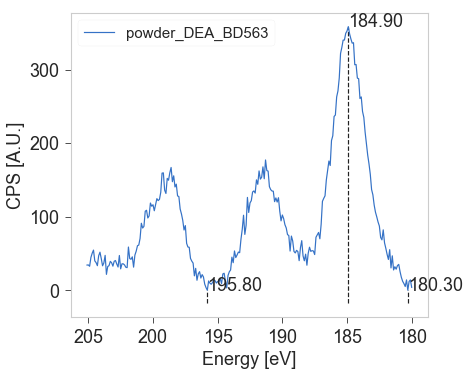

In [14]:
ind = flexible_integration_limits(bg_exps[0], region='Br3p')

In [18]:
x[ind[1]]

195.8

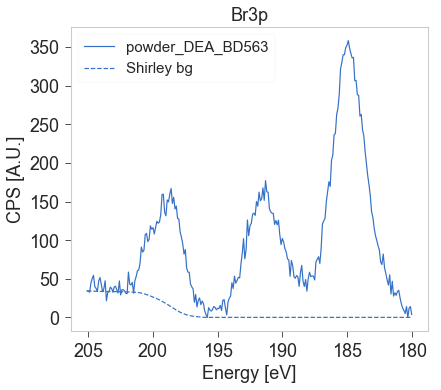

In [29]:
region = 'Br3p'
xp = bg_exps[0]
dfx = bg_exps[0].dfx[region].dropna()
x, y = dfx.energy.values, dfx.counts.values

ybg = shirley_loop(x, y, lmidx=0, rmidx=ind[1])
plt.plot(x, y, label=xp.name)
plt.plot(x, ybg, '--b', label='Shirley bg')
cosmetics_plot()
plt.title(region)

dfnew = pd.DataFrame({'energy' : x, 'counts' : y - ybg})
xpNew = deepcopy(xp)
xpNew.dfx[region] = dfnew
bg_exps[0] = xpNew

## Store processed experiments

In [30]:
import os
for xp, xpProc in zip(experiments, bg_exps):
    filepath, filename = os.path.split(xp.path)
    newpath = filepath + '/proc/'
    try:
        os.mkdir(newpath)
    except FileExistsError: pass
#     print(newpath + filename)
    write_processed_xp(newpath + filename, xpProc)

# Draft: ITO thickness from Si attenuation

$$ I_f = I_0 \exp{\left(-\frac{d_A \cos\theta}{\lambda_A} \right)}, $$

where $I_f$ and $I_0$ are the covered and clean intensities of the copper, $d_A$ is the coverage (thickness of layer A), $\theta$ is the takeoff angle and $\lambda_A$ is the mean free path of the material.

$\lambda_{ITO}$ = 0.56 nm

https://hal-cea.archives-ouvertes.fr/cea-01575439/document

$\cos\theta = \cos$(10º) = 0.9848


In [16]:
experiments[4].dfx

range        C_1s              N_1s             Cl_2p           O_1s  \
properties energy     counts energy     counts energy  counts energy   
0           295.0  1154.6667  405.0  1288.0000  215.0  1114.0  542.0   
1           294.9  1133.3333  404.9  1217.3333  214.9  1108.0  541.9   
2           294.8  1136.6667  404.8  1188.6667  214.8  1152.0  541.8   
3           294.7  1113.3333  404.7  1235.3333  214.7  1072.0  541.7   
4           294.6  1117.3333  404.6  1237.3333  214.6  1188.0  541.6   
5           294.5  1112.6667  404.5  1195.3333  214.5  1182.0  541.5   
6           294.4  1141.3333  404.4  1209.3333  214.4  1084.0  541.4   
7           294.3  1169.3333  404.3  1207.3333  214.3  1154.0  541.3   
8           294.2  1140.6667  404.2  1284.6667  214.2  1044.0  541.2   
9           294.1  1166.0000  404.1  1185.3333  214.1  1118.0  541.1   
10          294.0  1174.0000  404.0  1252.6667  214.0  1056.0  541.0   
11          293.9  1148.0000  403.9  1241.3333  213.9  1160.0  540.9   
12          293.8  1132.6667  403.8  1248.6667  213.8  1116.0  540.8   
13          293.7  1106.6667  403.7  1209.3333  213.7  1162.0  540.7   
14          293.6  1188.6667  403.6  1213.3333  213.6  1108.0  540.6   
15          293.5  1186.6667  403.5  1236.0000  213.5  1182.0  540.5   
16          293.4  1113.3333  403.4  1264.0000  213.4  1192.0  540.4   
17          293.3  1143.3333  403.3  1226.6667  213.3  1118.0  540.3   
18          293.2  1168.6667  403.2  1214.0000  213.2  1078.0  540.2   
19          293.1  1128.6667  403.1  1230.0000  213.1  1128.0  540.1   
20          293.0  1119.3333  403.0  1251.3333  213.0  1070.0  540.0   
21          292.9  1147.3333  402.9  1178.0000  212.9  1140.0  539.9   
22          292.8  1143.3333  402.8  1234.0000  212.8  1170.0  539.8   
23          292.7  1144.6667  402.7  1204.6667  212.7  1022.0  539.7   
24          292.6  1198.0000  402.6  1145.3333  212.6  1038.0  539.6   
25          292.5  1166.0000  402.5  1220.6667  212.5  1072.0  539.5   
26          292.4  1172.6667  402.4  1170.6667  212.4  1086.0  539.4   
27          292.3  1162.6667  402.3  1193.3333  212.3  1054.0  539.3   
28          292.2  1168.6667  402.2  1208.6667  212.2  1136.0  539.2   
29          292.1  1160.6667  402.1  1208.6667  212.1  1084.0  539.1   
..            ...        ...    ...        ...    ...     ...    ...   
471           NaN        NaN    NaN        NaN    NaN     NaN    NaN   
472           NaN        NaN    NaN        NaN    NaN     NaN    NaN   
473           NaN        NaN    NaN        NaN    NaN     NaN    NaN   
474           NaN        NaN    NaN        NaN    NaN     NaN    NaN   
475           NaN        NaN    NaN        NaN    NaN     NaN    NaN   
476           NaN        NaN    NaN        NaN    NaN     NaN    NaN   
477           NaN        NaN    NaN        NaN    NaN     NaN    NaN   
478           NaN        NaN    NaN        NaN    NaN     NaN    NaN   
479           NaN        NaN    NaN        NaN    NaN     NaN    NaN   
480           NaN        NaN    NaN        NaN    NaN     NaN    NaN   
481           NaN        NaN    NaN        NaN    NaN     NaN    NaN   
482           NaN        NaN    NaN        NaN    NaN     NaN    NaN   
483           NaN        NaN    NaN        NaN    NaN     NaN    NaN   
484           NaN        NaN    NaN        NaN    NaN     NaN    NaN   
485           NaN        NaN    NaN        NaN    NaN     NaN    NaN   
486           NaN        NaN    NaN        NaN    NaN     NaN    NaN   
487           NaN        NaN    NaN        NaN    NaN     NaN    NaN   
488           NaN        NaN    NaN        NaN    NaN     NaN    NaN   
489           NaN        NaN    NaN        NaN    NaN     NaN    NaN   
490           NaN        NaN    NaN        NaN    NaN     NaN    NaN   
491           NaN        NaN    NaN        NaN    NaN     NaN    NaN   
492           NaN        NaN    NaN        NaN    NaN     NaN    NaN   
493           NaN        NaN    NaN     

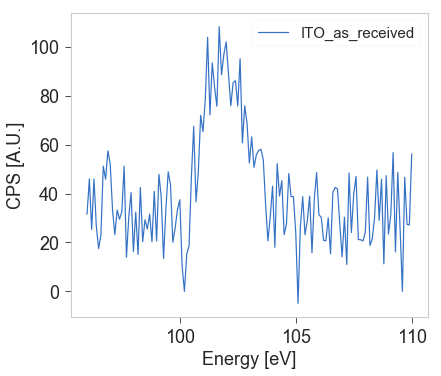

In [139]:
# xpf = crop_spectrum(bg_exps[0], region, eup=960, edw=925)
# xp0 = crop_spectrum(bg_exps[1], region, eup=960, edw=925)

plot_region(bg_exps[0], 'Si2p')
# plot_region(bg_exps[0], 'In3d')
cosmetics_plot()

In [141]:
If = np.trapz(bg_exps[0].dfx['Si2p'].dropna().counts, dx=0.1)/asf['Si2p']
I0 = np.trapz(bg_exps[0].dfx['In3d'].dropna().counts, dx=0.1)/asf['In3d']
from invisible_cities.core.system_of_units import nm
mfp = .56 * nm
costh = np.cos(10*np.pi/180)

thick = mfp/costh*np.log(I0/If)
thick / nm
# np.log(I0/If+1)

1.6298827933034263

######  Layer of 3.7 nm

## Taking the ratio of the maxima

In [29]:
If = np.max(xpf.dfx[region].dropna().counts)
I0 = np.max(xp0.dfx[region].dropna().counts)
from invisible_cities.core.system_of_units import nm
mfp = 3.85 * nm
costh = np.cos(10*np.pi/180)

thick = mfp/costh*np.log(I0/If)
thick / nm
# np.log(I0/If+1)

1.8414430142005438